
В ходе работы была осуществлена предобработка данных, а затем исследовательский анализ, который включает в себя:
     - отчет о динамике продаж (выручке), линейный график, отчет с детализацией по полям: FFP_FLAG, ROUTE_FLIGHT_TYPE, SALE_TYPE, общие отчеты по выручке по типам пассажиров, по типам перелета, по способам покупки, по программам лояльности, 
     - исследование выручки,
     - исследование сезонности продаж. 
     - проверка гипотезы о том, что выручка от продажи билетов для этих двух групп клиентов отличается. 
     - составления топ-10 популярных направлений перелета (город-город) отдельно для ВМЛ и МВЛ, с помощью датасета:
     https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat
     - корреляционныз анализ


In [1]:
# импортируем библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats as st
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import LassoCV, RidgeCV

In [2]:
df = pd.read_csv('air_data.csv', sep=';')
df

,ISSUE_DATE,FLIGHT_DATE_LOC,PAX_TYPE,REVENUE_AMOUNT,ORIG_CITY_CODE,DEST_CITY_CODE,ROUTE_FLIGHT_TYPE,FFP_FLAG,SALE_TYPE
0,2021-12-07 00:00:00,2022-01-11 00:00:00,AD,200,MOW,KGD,ВВЛ,NaN,ONLINE
1,2021-12-31 00:00:00,2022-01-03 00:00:00,AD,610,UUS,OVB,ВВЛ,NaN,OFFLINE
2,2021-11-28 00:00:00,2022-01-04 00:00:00,AD,390,KGD,MOW,ВВЛ,FFP,ONLINE
3,2021-12-08 00:00:00,2022-01-05 00:00:00,AD,190,VOZ,MOW,ВВЛ,NaN,ONLINE
4,2021-12-08 00:00:00,2022-01-12 00:00:00,AD,190,MOW,KRR,ВВЛ,FFP,OFFLINE
...,...,...,...,...,...,...,...,...,...
49995,2022-06-11 00:00:00,2022-06-22 00:00:00,CHD,480,MOW,OMS,ВВЛ,NaN,ONLINE
49996,2022-06-06 00:00:00,2022-06-20 00:00:00,AD,270,LED,MOW,ВВЛ,NaN,OFFLINE
49997,2022-06-26 00:00:00,2022-06-29 00:00:00,AD,230,MOW,KZN,ВВЛ,FFP,ONLINE
49998,2022-06-26 00:00:00,2022-06-28 00:00:00,AD,270,KZN,MOW,ВВЛ,NaN,OFFLINE


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   ISSUE_DATE         50000 non-null  object
 1   FLIGHT_DATE_LOC    50000 non-null  object
 2   PAX_TYPE           50000 non-null  object
 3   REVENUE_AMOUNT     50000 non-null  int64 
 4   ORIG_CITY_CODE     49998 non-null  object
 5   DEST_CITY_CODE     49999 non-null  object
 6   ROUTE_FLIGHT_TYPE  50000 non-null  object
 7   FFP_FLAG           19398 non-null  object
 8   SALE_TYPE          50000 non-null  object
dtypes: int64(1), object(8)
memory usage: 3.4+ MB


### 2.1 Приведите заголовки к удобному виду.

In [4]:
df.columns = df.columns.str.capitalize()

### 2.2 Проверьте типы данных.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Issue_date         50000 non-null  object
 1   Flight_date_loc    50000 non-null  object
 2   Pax_type           50000 non-null  object
 3   Revenue_amount     50000 non-null  int64 
 4   Orig_city_code     49998 non-null  object
 5   Dest_city_code     49999 non-null  object
 6   Route_flight_type  50000 non-null  object
 7   Ffp_flag           19398 non-null  object
 8   Sale_type          50000 non-null  object
dtypes: int64(1), object(8)
memory usage: 3.4+ MB


In [6]:
#проверка данных в столбцах
for col in df.columns:
    print(df[col].unique())

['2021-12-07 00:00:00' '2021-12-31 00:00:00' '2021-11-28 00:00:00'
 '2021-12-08 00:00:00' '2021-11-29 00:00:00' '2021-12-03 00:00:00'
 '2021-12-02 00:00:00' '2021-11-25 00:00:00' '2021-12-06 00:00:00'
 '2021-12-05 00:00:00' '2022-01-07 00:00:00' '2021-12-15 00:00:00'
 '2021-11-22 00:00:00' '2022-01-13 00:00:00' '2021-12-09 00:00:00'
 '2021-11-26 00:00:00' '2021-12-01 00:00:00' '2022-01-10 00:00:00'
 '2021-12-04 00:00:00' '2021-12-10 00:00:00' '2021-11-30 00:00:00'
 '2021-12-28 00:00:00' '2021-12-21 00:00:00' '2021-12-23 00:00:00'
 '2021-11-27 00:00:00' '2021-12-27 00:00:00' '2021-11-23 00:00:00'
 '2022-01-14 00:00:00' '2021-12-12 00:00:00' '2022-01-02 00:00:00'
 '2021-11-24 00:00:00' '2021-12-11 00:00:00' '2021-12-29 00:00:00'
 '2021-12-14 00:00:00' '2022-01-26 00:00:00' '2021-12-17 00:00:00'
 '2021-12-24 00:00:00' '2021-12-13 00:00:00' '2021-12-16 00:00:00'
 '2022-01-19 00:00:00' '2021-12-30 00:00:00' '2022-01-20 00:00:00'
 '2021-12-25 00:00:00' '2021-11-03 00:00:00' '2021-10-29 00:00

In [7]:
df[df['Orig_city_code'] == 'MOW']

,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type
0,2021-12-07 00:00:00,2022-01-11 00:00:00,AD,200,MOW,KGD,ВВЛ,NaN,ONLINE
4,2021-12-08 00:00:00,2022-01-12 00:00:00,AD,190,MOW,KRR,ВВЛ,FFP,OFFLINE
5,2021-11-29 00:00:00,2022-01-14 00:00:00,AD,250,MOW,DUS,МВЛ,NaN,ONLINE
6,2021-12-03 00:00:00,2022-01-06 00:00:00,AD,200,MOW,PEE,ВВЛ,FFP,ONLINE
7,2021-11-28 00:00:00,2022-01-07 00:00:00,CHD,70,MOW,AER,ВВЛ,FFP,ONLINE
...,...,...,...,...,...,...,...,...,...
49981,2022-06-27 00:00:00,2022-06-29 00:00:00,AD,290,MOW,KUF,ВВЛ,NaN,OFFLINE
49991,2022-06-15 00:00:00,2022-06-16 00:00:00,AD,260,MOW,UFA,ВВЛ,NaN,OFFLINE
49992,2022-06-22 00:00:00,2022-06-28 00:00:00,AD,810,MOW,BTK,ВВЛ,NaN,OFFLINE
49995,2022-06-11 00:00:00,2022-06-22 00:00:00,CHD,480,MOW,OMS,ВВЛ,NaN,ONLINE


In [8]:
#провека адекватности информаци в столбах

Столбцы Issue_date, Flight_date_loc - нужно перевести в формат даты.

In [9]:
df['Issue_date'] = pd.to_datetime(df['Issue_date'], format='%Y-%m-%dT%H:%M:%S')

In [10]:
df['Flight_date_loc'] = pd.to_datetime(df['Flight_date_loc'], format='%Y-%m-%dT%H:%M:%S')

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Issue_date         50000 non-null  datetime64[ns]
 1   Flight_date_loc    50000 non-null  datetime64[ns]
 2   Pax_type           50000 non-null  object        
 3   Revenue_amount     50000 non-null  int64         
 4   Orig_city_code     49998 non-null  object        
 5   Dest_city_code     49999 non-null  object        
 6   Route_flight_type  50000 non-null  object        
 7   Ffp_flag           19398 non-null  object        
 8   Sale_type          50000 non-null  object        
dtypes: datetime64[ns](2), int64(1), object(6)
memory usage: 3.4+ MB


### 2.3 Обработайте пропуски.

In [12]:
df.isna().sum()

Issue_date               0
Flight_date_loc          0
Pax_type                 0
Revenue_amount           0
Orig_city_code           2
Dest_city_code           1
Route_flight_type        0
Ffp_flag             30602
Sale_type                0
dtype: int64

In [13]:
df[df['Orig_city_code'].isna()]

,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type
2020,2022-02-17,2022-03-22,AD,440,NaN,KHV,МВЛ,NaN,ONLINE
8100,2022-05-02,2022-05-11,AD,440,NaN,KHV,МВЛ,NaN,OFFLINE


In [14]:
df[df['Dest_city_code'].isna()]

,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type
47582,2022-05-13,2022-07-28,AD,440,KHV,NaN,МВЛ,NaN,OFFLINE


Для дальнейшего анализа мы может удалить эти 3 строки, так как датасет большой.

In [15]:
df['Orig_city_code'] = df['Orig_city_code'].fillna('Нет данных')
df.drop(df[df['Orig_city_code'] == 'Нет данных'].index, inplace = True) 

In [16]:
df['Dest_city_code'] = df['Dest_city_code'].fillna('Нет данных')
df.drop(df[df['Dest_city_code'] == 'Нет данных'].index , inplace = True) 

In [17]:
df[df['Ffp_flag'].isna()]

,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type
0,2021-12-07,2022-01-11,AD,200,MOW,KGD,ВВЛ,NaN,ONLINE
1,2021-12-31,2022-01-03,AD,610,UUS,OVB,ВВЛ,NaN,OFFLINE
3,2021-12-08,2022-01-05,AD,190,VOZ,MOW,ВВЛ,NaN,ONLINE
5,2021-11-29,2022-01-14,AD,250,MOW,DUS,МВЛ,NaN,ONLINE
9,2021-11-25,2022-01-03,AD,280,MOW,KUF,ВВЛ,NaN,ONLINE
...,...,...,...,...,...,...,...,...,...
49992,2022-06-22,2022-06-28,AD,810,MOW,BTK,ВВЛ,NaN,OFFLINE
49994,2022-06-27,2022-06-28,AD,450,OVB,LED,ВВЛ,NaN,OFFLINE
49995,2022-06-11,2022-06-22,CHD,480,MOW,OMS,ВВЛ,NaN,ONLINE
49996,2022-06-06,2022-06-20,AD,270,LED,MOW,ВВЛ,NaN,OFFLINE


Как видно, пропусков очень много, вероятнее всего, они означают, что отсутствует программа лояльности. Заменим пропуски на 0, а наличие на 1.

In [18]:
df['Ffp_flag'] = df['Ffp_flag'].fillna(0)

In [19]:
df.loc[df['Ffp_flag'] == "FFP", 'Ffp_flag'] = 1

In [20]:
df['Ffp_flag'].unique() #действительно, больше нет никаких значений

array([0, 1], dtype=object)

In [21]:
#все пропуски нивелированы
df.isna().sum()

Issue_date           0
Flight_date_loc      0
Pax_type             0
Revenue_amount       0
Orig_city_code       0
Dest_city_code       0
Route_flight_type    0
Ffp_flag             0
Sale_type            0
dtype: int64

### 2.4 Проверьте наличие дубликатов.

In [22]:
#найдено 169 дубликатов
df.duplicated().sum()

169

In [23]:
df.loc[df.duplicated(keep=False)] #как видно, строчки полностью совпадают

,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type
337,2021-10-29,2021-11-12,AD,220,MOW,KZN,ВВЛ,1,ONLINE
338,2021-10-29,2021-11-12,AD,220,MOW,KZN,ВВЛ,1,ONLINE
649,2022-02-11,2022-08-03,AD,580,PKC,OVB,ВВЛ,0,OFFLINE
670,2022-02-11,2022-08-03,AD,580,PKC,OVB,ВВЛ,0,OFFLINE
716,2022-02-08,2022-08-01,AD,360,MMK,MOW,ВВЛ,0,OFFLINE
...,...,...,...,...,...,...,...,...,...
49360,2022-03-30,2022-05-03,AD,410,MOW,OVB,ВВЛ,1,ONLINE
49424,2022-03-30,2022-05-03,AD,410,MOW,OVB,ВВЛ,1,ONLINE
49677,2022-04-02,2022-05-02,AD,470,NUX,MOW,ВВЛ,0,ONLINE
49968,2022-06-28,2022-06-30,AD,950,MOW,HTA,ВВЛ,0,OFFLINE


In [24]:
df = df.drop_duplicates().reset_index(drop=True)
df

,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type
0,2021-12-07,2022-01-11,AD,200,MOW,KGD,ВВЛ,0,ONLINE
1,2021-12-31,2022-01-03,AD,610,UUS,OVB,ВВЛ,0,OFFLINE
2,2021-11-28,2022-01-04,AD,390,KGD,MOW,ВВЛ,1,ONLINE
3,2021-12-08,2022-01-05,AD,190,VOZ,MOW,ВВЛ,0,ONLINE
4,2021-12-08,2022-01-12,AD,190,MOW,KRR,ВВЛ,1,OFFLINE
...,...,...,...,...,...,...,...,...,...
49823,2022-06-11,2022-06-22,CHD,480,MOW,OMS,ВВЛ,0,ONLINE
49824,2022-06-06,2022-06-20,AD,270,LED,MOW,ВВЛ,0,OFFLINE
49825,2022-06-26,2022-06-29,AD,230,MOW,KZN,ВВЛ,1,ONLINE
49826,2022-06-26,2022-06-28,AD,270,KZN,MOW,ВВЛ,0,OFFLINE


In [25]:
df.duplicated().sum() #все дубликаты удалены.

0

### 2.5 Исключите нулевые значения в выручке для дальнейшего исследования.

In [26]:
df['Revenue_amount'].unique() #как видно, существуют нулевые значения, удалим те строки, в которых они встречаются.

array([ 200,  610,  390,  190,  250,   70,  490,  280,  360,  380,  210,
          0,  370, 1090,  470,  450,  300,  180,  570,  430,  350,  130,
        230,  290,  160,  420,  690,  340,  310,  520,  440,  400,  930,
        240,  170,  270,  150,  560,  260,  220,  680, 1820,  410,  630,
        550,  840,  110,  140,  100,  640,  720,  460,  120,  540,  330,
       1030,   40,  320,  530,  820,   50,  480,  960,  500,  760, 2000,
        810,  670,  790,  950,  590,  600,  510,  710,  830, 1140,  620,
        750,  770, 1200, 1110,  970, 1180,  740,  650,  730,  660,  800,
        860,  890,  920,  580,  700,  880,  850,  940, 1070,  910, 1690,
        870, 1930,  780, 2990, 1780,  980, 1620,   60,   90, 1150, 1160,
       1040,  900, 1760, 1320,   80, 1020, 2270,  990, 1260, 1080, 1940,
       1060, 1280, 1190, 1470, 1810, 1520, 1010, 1000, 1360, 1340, 1220,
       1980, 1530, 1330, 2300, 1450, 1630, 1510, 2060, 1590, 1120, 1500,
       1860, 1250, 1050, 1660, 1460, 1610, 2050, 11

In [27]:
df.loc[df['Revenue_amount'] == 0] #таких строк 466

,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type
13,2021-12-05,2022-01-16,INF,0,PEZ,MOW,ВВЛ,0,OFFLINE
32,2021-12-08,2022-01-11,INF,0,UFA,MOW,ВВЛ,0,ONLINE
106,2021-12-05,2022-01-08,INF,0,MOW,UFA,ВВЛ,0,ONLINE
228,2021-12-04,2022-01-07,INF,0,MOW,AER,ВВЛ,0,ONLINE
288,2021-10-26,2021-11-02,INF,0,MOW,PEZ,ВВЛ,0,ONLINE
...,...,...,...,...,...,...,...,...,...
49213,2022-04-09,2022-05-01,INF,0,OVB,AER,ВВЛ,0,ONLINE
49248,2022-04-01,2022-05-17,INF,0,MOW,KZN,ВВЛ,0,ONLINE
49312,2021-12-16,2021-12-16,AD,0,OVB,MOW,ВВЛ,0,OFFLINE
49519,2022-04-15,2022-05-15,INF,0,NYM,MOW,ВВЛ,0,OFFLINE


In [28]:
index_names = df[df['Revenue_amount'] == 0].index 

In [29]:
df.drop(index_names, inplace = True) 

In [30]:
df.reset_index()

,index,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type
0,0,2021-12-07,2022-01-11,AD,200,MOW,KGD,ВВЛ,0,ONLINE
1,1,2021-12-31,2022-01-03,AD,610,UUS,OVB,ВВЛ,0,OFFLINE
2,2,2021-11-28,2022-01-04,AD,390,KGD,MOW,ВВЛ,1,ONLINE
3,3,2021-12-08,2022-01-05,AD,190,VOZ,MOW,ВВЛ,0,ONLINE
4,4,2021-12-08,2022-01-12,AD,190,MOW,KRR,ВВЛ,1,OFFLINE
...,...,...,...,...,...,...,...,...,...,...
49357,49823,2022-06-11,2022-06-22,CHD,480,MOW,OMS,ВВЛ,0,ONLINE
49358,49824,2022-06-06,2022-06-20,AD,270,LED,MOW,ВВЛ,0,OFFLINE
49359,49825,2022-06-26,2022-06-29,AD,230,MOW,KZN,ВВЛ,1,ONLINE
49360,49826,2022-06-26,2022-06-28,AD,270,KZN,MOW,ВВЛ,0,OFFLINE


In [31]:
#для дальнейшего анализа добавим столбцы года, месяца и дня покупки билета.
df['Day'] = df['Issue_date'].dt.day.astype('int') 
df['Month'] = df['Issue_date'].dt.month.astype('int')
df['Year'] = df['Issue_date'].dt.year.astype('int')
df['Year_month'] = df['Year'].astype('str') + '.' + df['Month'].astype('str')


In [32]:
df


,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type,Day,Month,Year,Year_month
0,2021-12-07,2022-01-11,AD,200,MOW,KGD,ВВЛ,0,ONLINE,7,12,2021,2021.12
1,2021-12-31,2022-01-03,AD,610,UUS,OVB,ВВЛ,0,OFFLINE,31,12,2021,2021.12
2,2021-11-28,2022-01-04,AD,390,KGD,MOW,ВВЛ,1,ONLINE,28,11,2021,2021.11
3,2021-12-08,2022-01-05,AD,190,VOZ,MOW,ВВЛ,0,ONLINE,8,12,2021,2021.12
4,2021-12-08,2022-01-12,AD,190,MOW,KRR,ВВЛ,1,OFFLINE,8,12,2021,2021.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...
49823,2022-06-11,2022-06-22,CHD,480,MOW,OMS,ВВЛ,0,ONLINE,11,6,2022,2022.6
49824,2022-06-06,2022-06-20,AD,270,LED,MOW,ВВЛ,0,OFFLINE,6,6,2022,2022.6
49825,2022-06-26,2022-06-29,AD,230,MOW,KZN,ВВЛ,1,ONLINE,26,6,2022,2022.6
49826,2022-06-26,2022-06-28,AD,270,KZN,MOW,ВВЛ,0,OFFLINE,26,6,2022,2022.6


# 3. Исследовательский анализ данных:

### 3.1 Создайте отчет о динамике продаж (выручке). Постройте линейный график. Повторите отчет с детализацией по полям: FFP_FLAG, ROUTE_FLIGHT_TYPE, SALE_TYPE. Постройте общие отчеты по выручке по типам пассажиров, по типам перелета, по способам покупки, по программам лояльности. Визуализируйте каждый отчет. Решение о детализации отчетов примите самостоятельно.

[Text(0.5, 1.0, 'Динамика выручки за исследуемый период'),
 Text(0.5, 0, 'Дата'),
 Text(0, 0.5, 'Величина выручки')]

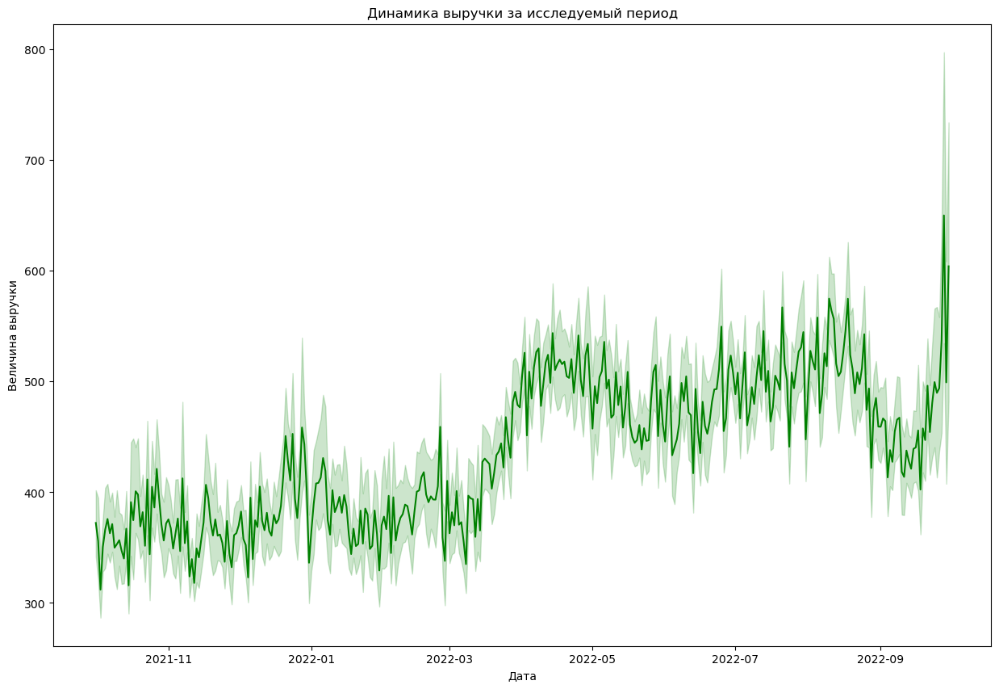

In [33]:
plt.figure(figsize=(15, 10))
sns.lineplot(data=df, x='Issue_date', y='Revenue_amount',color='green').set(title='Динамика выручки за исследуемый период',
                                                                 xlabel='Дата', 
                                                                 ylabel='Величина выручки',
                                                                 )


Как видно, в целом за исследуемый период средняя величина выручки постоянно колебалась. Но в целом имела тенденцию к росту, так пиковых значений она достигла в конце 2022 года. Наблюдается тенденция к росту средней выручки в период новогодних праздников, а также в летнее время.

<AxesSubplot:title={'center':'Количество покупок, совершенных в разные периоды'}, xlabel='Дата', ylabel='Количество билетов'>

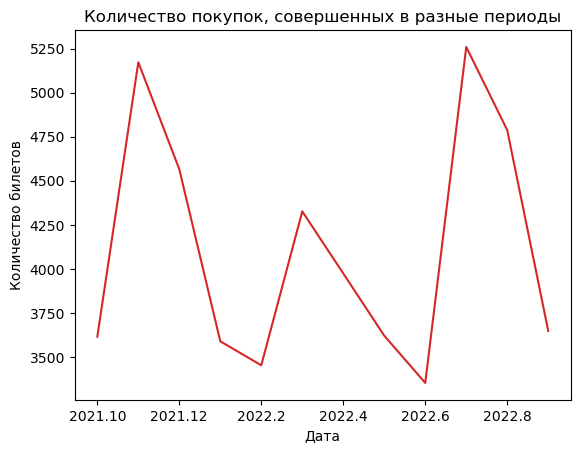

In [34]:
application = df.pivot_table(index='Year_month',
                           aggfunc='count', 
                           values='Revenue_amount')
application = application.sort_values(by ='Year_month', ascending=True)
application.reset_index(inplace=True)
application.plot(y='Revenue_amount', x='Year_month', title=f'Количество покупок, совершенных в разные периоды',  color='C3',xlabel='Дата',ylabel='Количество билетов',legend=False)

Как видно, число купленных в определенный период времени билетов постоянно варьируется. Наибольшее число покупок совершается перед новым годом, а также летом. Собственно, возможно поэтому цена в данные периоды времени растет.

Повторите отчет с детализацией по полям: FFP_FLAG, ROUTE_FLIGHT_TYPE, SALE_TYPE. 

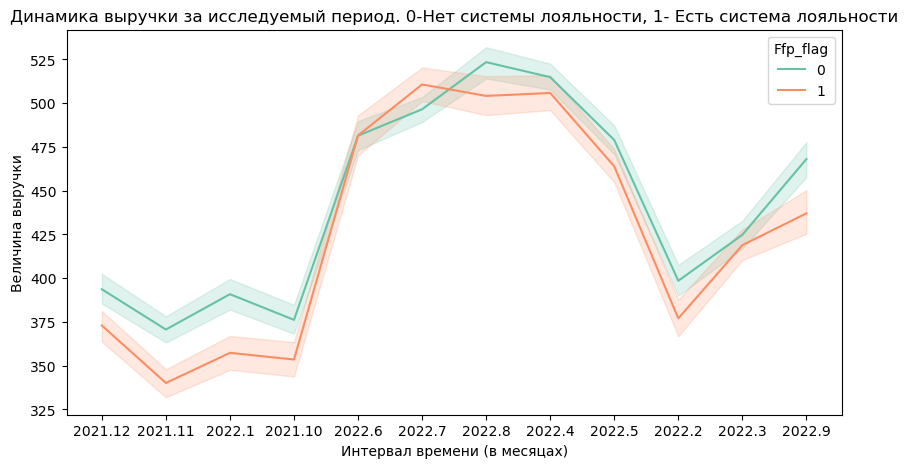

In [35]:
plt.figure(figsize=(10, 5))
sns.lineplot(data=df, x='Year_month', y='Revenue_amount',hue='Ffp_flag',palette='Set2').set(title='Динамика выручки за исследуемый период. 0-Нет системы лояльности, 1- Есть система лояльности',
                                                                 xlabel='Интервал времени (в месяцах)', 
                                                                 ylabel='Величина выручки'
                                                                 )
plt.show()

В целом динамика для каждой категории одинаковая.

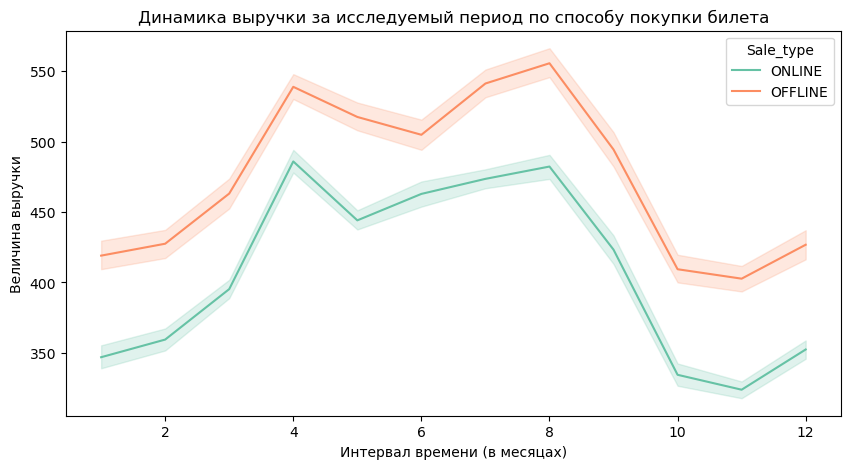

In [36]:
plt.figure(figsize=(10, 5))
sns.lineplot(data=df, x='Month', y='Revenue_amount',hue='Sale_type',palette='Set2').set(title='Динамика выручки за исследуемый период по способу покупки билета',
                                                                 xlabel='Интервал времени (в месяцах)', 
                                                                 ylabel='Величина выручки'
                                                                 )
plt.show()

Как видно по графику, средняя выручка по проданным онлайн билетам ниже, чем по проданным офлайн. Динамика одинаковая.

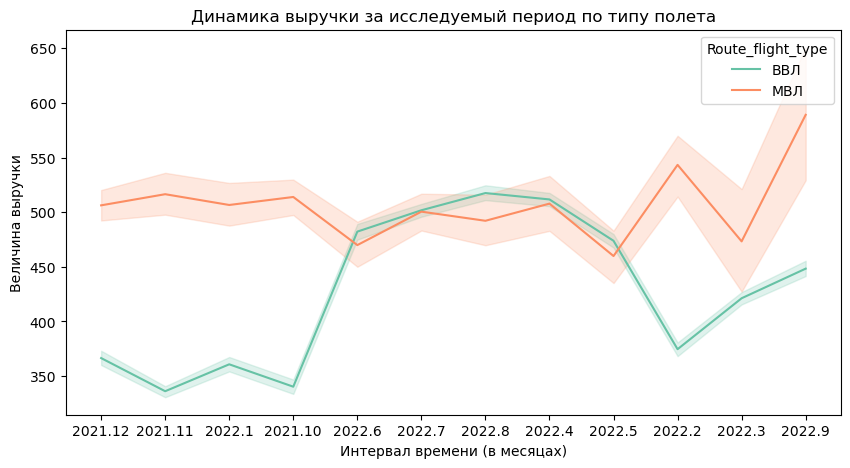

In [37]:
plt.figure(figsize=(10, 5))
sns.lineplot(data=df, x='Year_month', y='Revenue_amount',hue='Route_flight_type',palette='Set2').set(title='Динамика выручки за исследуемый период по типу полета',
                                                                 xlabel='Интервал времени (в месяцах)', 
                                                                 ylabel='Величина выручки'
                                                                 )
plt.show()

Как видно по графику, в осенний и зимний периоды средняя цена на международные рейсы выше, чем на внутренние. Также по внутренним рейсам в данные периоды цена снижается, а по международным - возрастает.

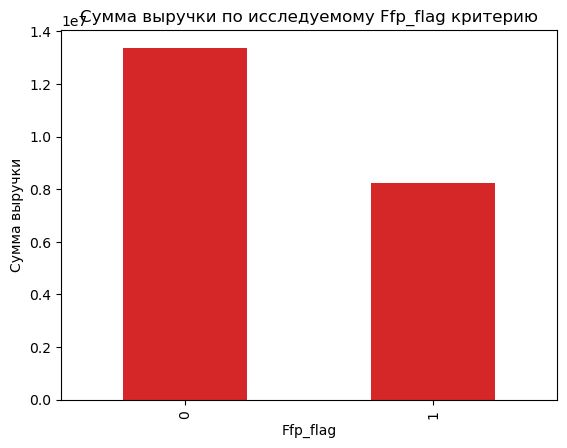

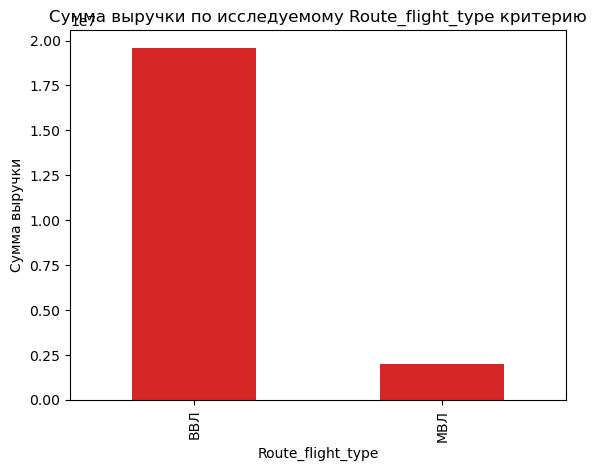

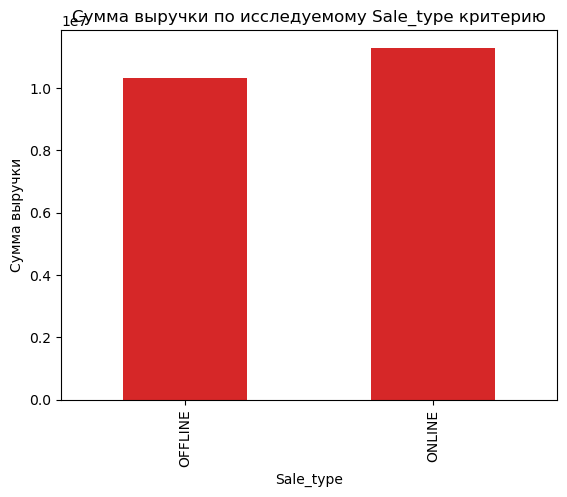

In [38]:
#посчитаем суммарную выручку по каждому критерию
non = ['Ffp_flag', 'Route_flight_type','Sale_type']
for i in non:
    application = df.pivot_table(index=i,
                           aggfunc='sum', 
                           values='Revenue_amount')
    application = application.sort_values(by =i, ascending=True)
    application.reset_index(inplace=True)
    application.plot(kind='bar', y='Revenue_amount', x=i, title=f'Сумма выручки по исследуемому {i} критерию', color='C3',xlabel=i,ylabel='Сумма выручки',legend=False)

Общий вывод по гистограммам:наибольшую общую выручку принесли билеты, купленные лицами, незарегестрированными в программе лояльности, а также по внутренним рейсам и (или) купленные онлайн. Проведем аналогичное исследование по количеству совершенных покупок.

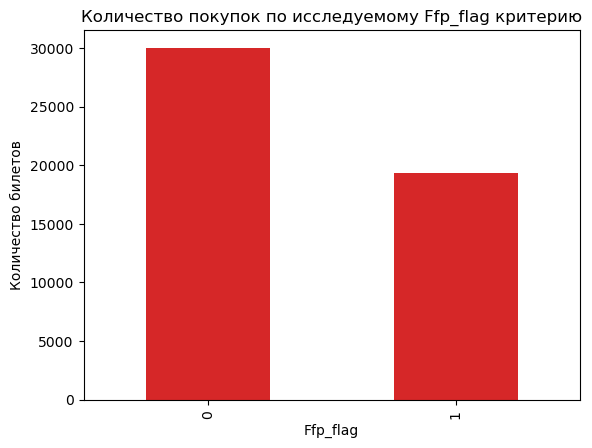

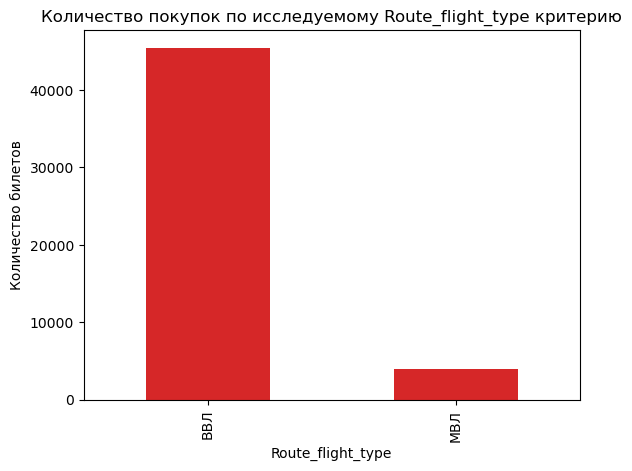

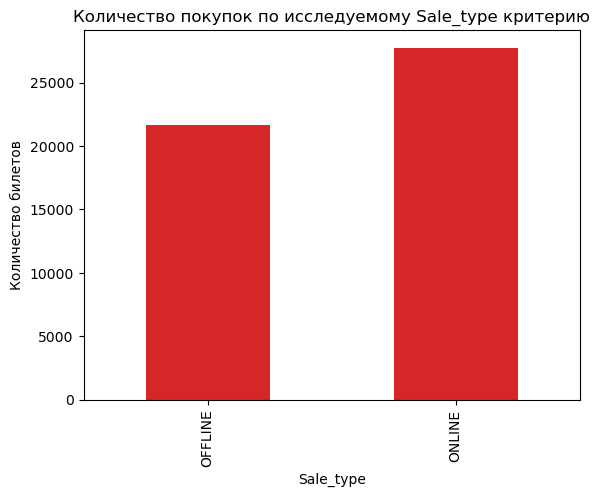

In [39]:
non = ['Ffp_flag', 'Route_flight_type','Sale_type']
for i in non:
    application = df.pivot_table(index=i,
                           aggfunc='count', 
                           values='Revenue_amount')
    application = application.sort_values(by =i, ascending=True)
    application.reset_index(inplace=True)
    application.plot(kind='bar', y='Revenue_amount', x=i, title=f'Количество покупок по исследуемому {i} критерию',  color='C3',xlabel=i,ylabel='Количество билетов',legend=False)

Общий вывод по гистограммам: как видно, большая часть пассажиров не используют программу лояльности клиентов. Также практически в 11 раз больше билетов было куплено по внутренним рейсам (по сравнению с международными) + клиенты предпочитают совершать покупку билетов онлайн.

In [40]:
type_flingt = df.pivot_table(index='Route_flight_type',
                            aggfunc=['sum','count'], 
                           values='Revenue_amount')
type_flingt .reset_index(inplace=True)
type_flingt 

,Route_flight_type,sum,count
,,Revenue_amount,Revenue_amount
0,ВВЛ,19610480,45468
1,МВЛ,1991890,3894


Становится очевидно, что несмотря на то, что количество перелетов по международным рейсам меньше примерно в 11 раз, стоимость одного перерета явно выше, чем по внутренним рейсам. При этом, в целом больше выручки принесли внутренние рейсы, количество которых гораздо больше.

Отдельно проанализируем типы пассажиров.

<AxesSubplot:title={'center':'Количество покупок, совершенных разными типами пассажиров'}, xlabel='Тип пассажира', ylabel='Количество билетов'>

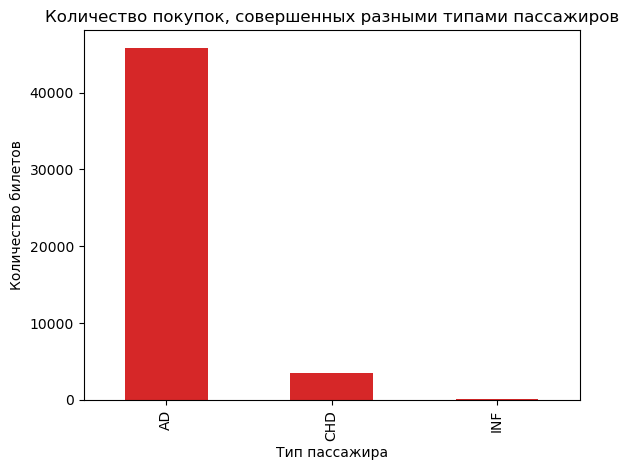

In [41]:
application = df.pivot_table(index='Pax_type',
                           aggfunc='count', 
                           values='Revenue_amount')
application = application.sort_values(by ='Pax_type', ascending=True)
application.reset_index(inplace=True)
application.plot(kind='bar', y='Revenue_amount', x='Pax_type', title=f'Количество покупок, совершенных разными типами пассажиров',  color='C3',xlabel='Тип пассажира',ylabel='Количество билетов',legend=False)

Как видно по гистограмме, большая часть пассажиров взрослого возраста, неиндефицированных пассажиров очень мало.

<AxesSubplot:title={'center':'Количество покупок, совершенных разными типами пассажиров'}, xlabel='Тип пассажира', ylabel='Количество билетов'>

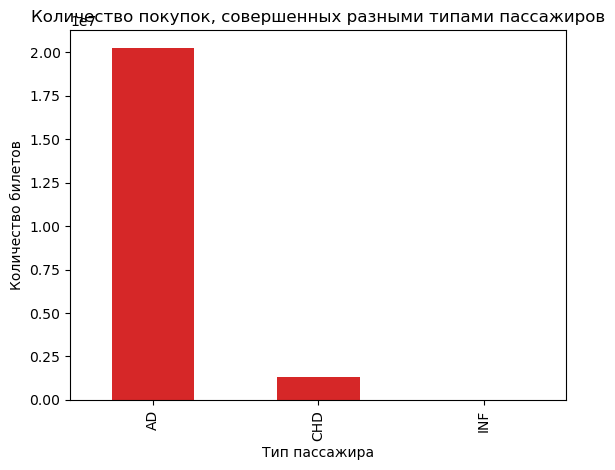

In [42]:
application = df.pivot_table(index='Pax_type',
                           aggfunc='sum', 
                           values='Revenue_amount')
application = application.sort_values(by ='Pax_type', ascending=True)
application.reset_index(inplace=True)
application.plot(kind='bar', y='Revenue_amount', x='Pax_type', title=f'Количество покупок, совершенных разными типами пассажиров',  color='C3',xlabel='Тип пассажира',ylabel='Количество билетов',legend=False)

Ситуация с общей суммой вырочки от билетов аналогичная, большую выручку принесли взрослые пассажиры.

In [43]:
#Изучим также, сколько в среднем стоит билет для каждой категории пассажира.

typep_flingt = df.pivot_table(index=['Pax_type','Route_flight_type'],
                            aggfunc=['sum','count','mean'], 
                           values='Revenue_amount')
typep_flingt .reset_index(inplace=True)
typep_flingt 

,Pax_type,Route_flight_type,sum,count,mean
,,,Revenue_amount,Revenue_amount,Revenue_amount
0,AD,ВВЛ,18438670,42349,435.398002
1,AD,МВЛ,1820540,3482,522.843194
2,CHD,ВВЛ,1168690,3097,377.361963
3,CHD,МВЛ,164740,348,473.390805
4,INF,ВВЛ,3120,22,141.818182
5,INF,МВЛ,6610,64,103.281250


Вывод: Средняя стоимость по международным рейсам выше средней стоимости по внутренним рейсам выше как для взрослых, так и для детей. Детские билеты в целом дешевле чем взрослые, что очевидно. Наблюдается странная зависимость средней цены по внутренним и международным рейсам для неиндефицированных пассажиров, МВЛ ниже, чем ВВЛ. Воможно, в данных допущена ошибка.

In [44]:
#создадим портрет типичного клиента авиакомпании по критериям: тип пассажира, наличие программы лояльности, способ покупки билета,тип рейса
type_pus = df.pivot_table(index=['Pax_type','Route_flight_type','Ffp_flag','Sale_type'],
                            aggfunc='count', 
                           values='Revenue_amount')
type_pus.reset_index(inplace=True)
type_pus.sort_values(by ='Revenue_amount', ascending=False)
type_pus 

,Pax_type,Route_flight_type,Ffp_flag,Sale_type,Revenue_amount
0,AD,ВВЛ,0,OFFLINE,13782
1,AD,ВВЛ,0,ONLINE,10090
2,AD,ВВЛ,1,OFFLINE,4506
3,AD,ВВЛ,1,ONLINE,13971
4,AD,МВЛ,0,OFFLINE,2043
5,AD,МВЛ,0,ONLINE,972
6,AD,МВЛ,1,OFFLINE,86
7,AD,МВЛ,1,ONLINE,381
8,CHD,ВВЛ,0,OFFLINE,902
9,CHD,ВВЛ,0,ONLINE,1825


Как видно, наиболее частный клиент авиакомпаний - взрослый человек, соврешающий полеты по внутренним рейсам, зарегестрированный в программе лояльности и покупающий билеты приемущественно онлайн.

### 3.2 Исследуйте выручку, примите решение об исключении выбросов для дальнейшего исследования, руководствуясь минимизацией потерь в данных.

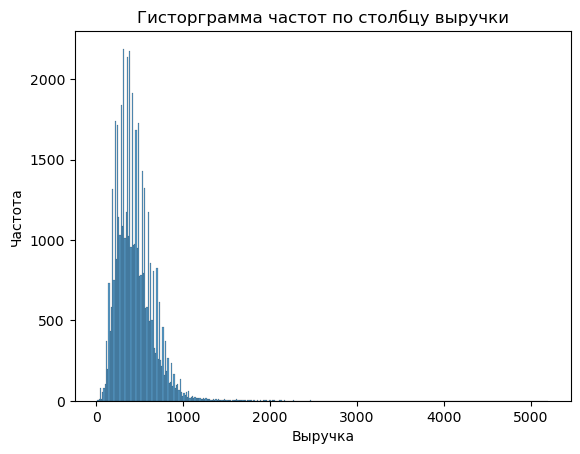

In [45]:
#построим гистограмму частот по выручке
sns.histplot(data=df['Revenue_amount']).set(title='Гисторграмма частот по столбцу выручки', ylabel='Частота',
                                                                               xlabel='Выручка')
plt.show()

По графику видно, что выбросы существуют (высокие единичные значения).

In [46]:
#посмотрим основные характеристики этого слобца
df['Revenue_amount'].describe()

count    49362.000000
mean       437.631579
std        214.611412
min         10.000000
25%        290.000000
50%        400.000000
75%        550.000000
max       5200.000000
Name: Revenue_amount, dtype: float64

Основные характеристики показывают, что действительно, существуют значительные отклонения от среднего.

<AxesSubplot:>

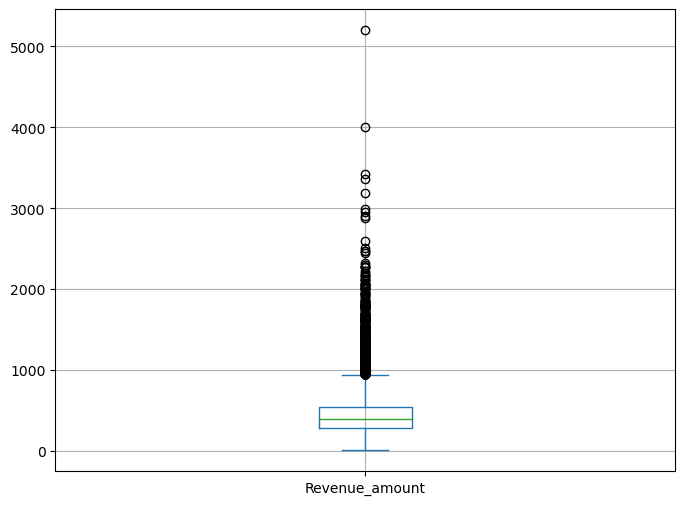

In [47]:
#построим график boxplot для того, чтобы проверить наличие выбросов
df['Revenue_amount'].plot(kind='box', figsize=(8, 6), grid=True)

По графику видно, что выбросы есть. Попробуем их удалить.

In [48]:
df['Revenue_amount'].describe()
#видно, что среднее значение примерно в 10 раз меньше максимального значения выручки - ненормальная ситуация.

count    49362.000000
mean       437.631579
std        214.611412
min         10.000000
25%        290.000000
50%        400.000000
75%        550.000000
max       5200.000000
Name: Revenue_amount, dtype: float64

In [49]:
#найдем границы усов
q75 = np.percentile(df['Revenue_amount'], 75)
q25 = np.percentile(df['Revenue_amount'], 25) 
iqr = q75 - q25
ejection_h = q75+iqr*1.5
ejection_l = q25-iqr*1.5
print (ejection_h, ejection_l)
#нижняя граница - отрицательная, ее можно убрать из анализа, так как выручка отрицательной не бывает

940.0 -100.0


In [50]:
#определим число выбросов
n_ejection = df['Revenue_amount'][df['Revenue_amount'] >= ejection_h].count()
print('Число выбросов:', n_ejection)

Число выбросов: 1042


In [51]:
n_ejection = df['Revenue_amount'][df['Revenue_amount'] > ejection_h].count()
print('Число выбросов:', n_ejection)

Число выбросов: 987


55 выбросов попадают на границу верхнего уса. Возникает вопрос, использовать строгое или нестрогое неравенство, окажут ли эти 55 значений влияние на распределение данных или нет. Для того, чтобы принять решение о том, сохранять или нет данные значения, проверим данные (сохранив в-первом случае и удалив во-втором эти 55 значений).

In [52]:
good_df = df[df['Revenue_amount'] < ejection_h]
good_df = good_df.reset_index(drop=True)
good_df

,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type,Day,Month,Year,Year_month
0,2021-12-07,2022-01-11,AD,200,MOW,KGD,ВВЛ,0,ONLINE,7,12,2021,2021.12
1,2021-12-31,2022-01-03,AD,610,UUS,OVB,ВВЛ,0,OFFLINE,31,12,2021,2021.12
2,2021-11-28,2022-01-04,AD,390,KGD,MOW,ВВЛ,1,ONLINE,28,11,2021,2021.11
3,2021-12-08,2022-01-05,AD,190,VOZ,MOW,ВВЛ,0,ONLINE,8,12,2021,2021.12
4,2021-12-08,2022-01-12,AD,190,MOW,KRR,ВВЛ,1,OFFLINE,8,12,2021,2021.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...
48315,2022-06-11,2022-06-22,CHD,480,MOW,OMS,ВВЛ,0,ONLINE,11,6,2022,2022.6
48316,2022-06-06,2022-06-20,AD,270,LED,MOW,ВВЛ,0,OFFLINE,6,6,2022,2022.6
48317,2022-06-26,2022-06-29,AD,230,MOW,KZN,ВВЛ,1,ONLINE,26,6,2022,2022.6
48318,2022-06-26,2022-06-28,AD,270,KZN,MOW,ВВЛ,0,OFFLINE,26,6,2022,2022.6


In [53]:
good_df_2 = df[df['Revenue_amount'] <= ejection_h]
good_df_2 = good_df_2.reset_index(drop=True)
good_df_2

,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type,Day,Month,Year,Year_month
0,2021-12-07,2022-01-11,AD,200,MOW,KGD,ВВЛ,0,ONLINE,7,12,2021,2021.12
1,2021-12-31,2022-01-03,AD,610,UUS,OVB,ВВЛ,0,OFFLINE,31,12,2021,2021.12
2,2021-11-28,2022-01-04,AD,390,KGD,MOW,ВВЛ,1,ONLINE,28,11,2021,2021.11
3,2021-12-08,2022-01-05,AD,190,VOZ,MOW,ВВЛ,0,ONLINE,8,12,2021,2021.12
4,2021-12-08,2022-01-12,AD,190,MOW,KRR,ВВЛ,1,OFFLINE,8,12,2021,2021.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...
48370,2022-06-11,2022-06-22,CHD,480,MOW,OMS,ВВЛ,0,ONLINE,11,6,2022,2022.6
48371,2022-06-06,2022-06-20,AD,270,LED,MOW,ВВЛ,0,OFFLINE,6,6,2022,2022.6
48372,2022-06-26,2022-06-29,AD,230,MOW,KZN,ВВЛ,1,ONLINE,26,6,2022,2022.6
48373,2022-06-26,2022-06-28,AD,270,KZN,MOW,ВВЛ,0,OFFLINE,26,6,2022,2022.6


Проверим выборки на нормальность распределения, тест  Шапиро-Уилка не подходит, так как объем выборки большой. Определеим визуально.

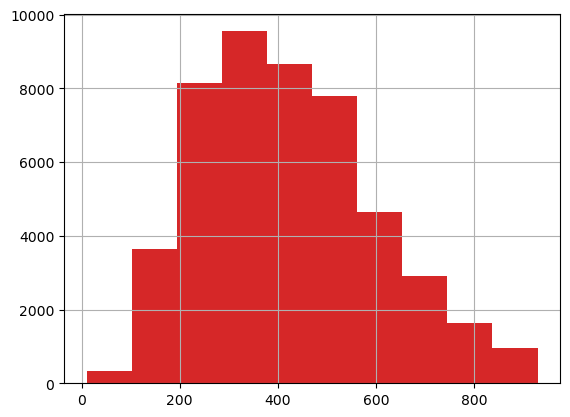

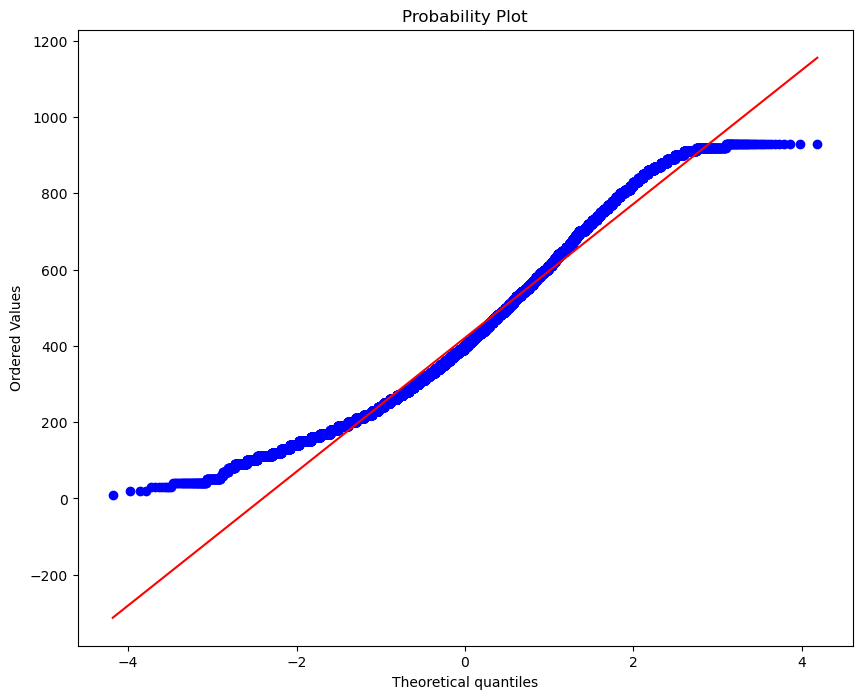

In [54]:
# проверим, что изменилось на графиках
good_df['Revenue_amount'].hist( color='C3')
plt.figure(figsize=(10, 8))
# построение Q-Q plot 
st.probplot(good_df['Revenue_amount'], dist='norm', plot=plt)
plt.show()

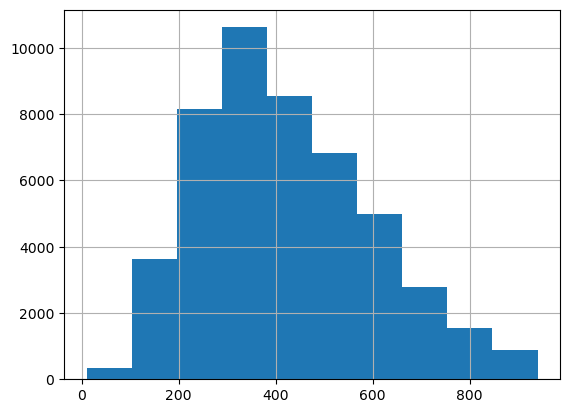

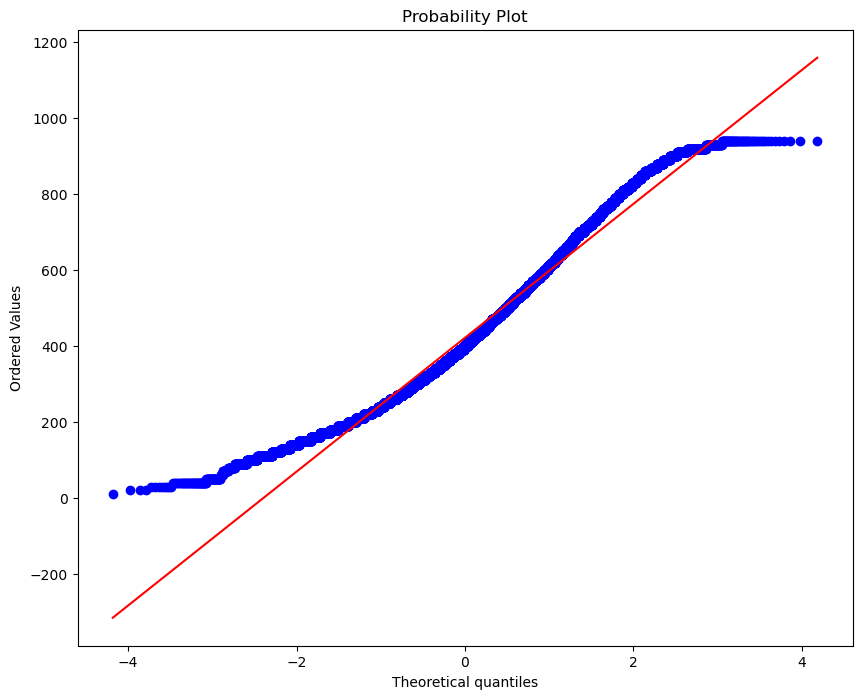

In [55]:
good_df_2['Revenue_amount'].hist()
plt.figure(figsize=(10, 8))
# построение Q-Q plot 
st.probplot(good_df_2['Revenue_amount'], dist='norm', plot=plt)
plt.show()

По графикам особой разницы между выборками не видно, однако, становится очевидно, что выборки не имеют нормального распределения. Сравним два датасета между собой с помощью непараметрического теста Уилкоксона-Манна-Уитни, чтобы понять, если ли весомые различия между выборками или нет. Используем данный тест, так как выборки не соответствуют нормальному распределению.

H0: Между двумя выборками нет статистически важных различий.

H1: Между двумя выборками существуют статистически важные различия.


In [56]:
alpha = 0.05 # уровень статистической значимости
         
# проводим тест Уилкоксона-Манна-Уитни для сравнения двух независимых выборок
results = st.mannwhitneyu(good_df['Revenue_amount'], good_df_2['Revenue_amount'])

print('p-value:', results.pvalue)

# формулируем результаты
if results.pvalue < alpha:
    print('Отклоняем нулевуюю гипотезу')
else:
    print('Нет оснований отклонить нулевую гипотезу')

p-value: 0.759435175362749
Нет оснований отклонить нулевую гипотезу


Как видно, между выборками нет статистически важных различий. Тогда для минимизации потерь в данных возьмем датасет с включением этих 55 значений.


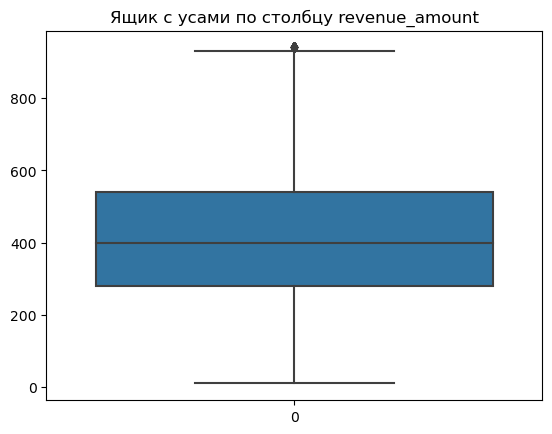

In [57]:
#построим ящик с усами для проверки ознкомления
sns.boxplot(data=good_df_2['Revenue_amount']).set(title='Ящик с усами по столбцу revenue_amount')
plt.show()

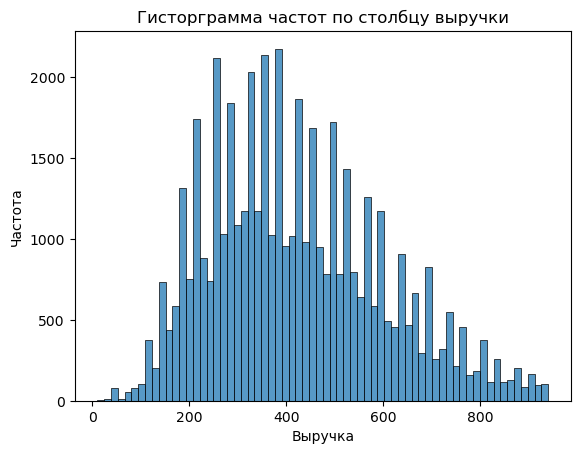

In [58]:
#построим гистограмму частот по выручке
sns.histplot(data=good_df_2['Revenue_amount']).set(title='Гисторграмма частот по столбцу выручки', ylabel='Частота',
                                                                               xlabel='Выручка')
plt.show()

Как видно по графику, избавление от выбросов привело к тому, что данные распределяются куда равномернее, чем было раньше.

In [59]:
#перезапишем датасет 
df = good_df_2

Надеюсь, правильно поняла комментарий по поводу ошибок.

### 3.3 Исследуйте сезонность продаж. Дополнительно проверьте гипотезу о том, что выручка от продаж осенью и зимой отличается. Исследуйте выручку и число продаж по месяцам, проверьте корреляцию.

In [60]:
#добавим еще один столбец в данные - сезон.
def recency(month):
    
    if 9 <= month <= 11:
        return 'Autumn'
    elif 3 <= month <= 5:
        return 'Spring'
    elif 6 <= month <= 8:
        return 'Summer'
    else:
        return 'Winter'
df['season'] = df['Month'].apply(recency) #с помощью apply применяем функцию к стобцу 

In [61]:
df

,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type,Day,Month,Year,Year_month,season
0,2021-12-07,2022-01-11,AD,200,MOW,KGD,ВВЛ,0,ONLINE,7,12,2021,2021.12,Winter
1,2021-12-31,2022-01-03,AD,610,UUS,OVB,ВВЛ,0,OFFLINE,31,12,2021,2021.12,Winter
2,2021-11-28,2022-01-04,AD,390,KGD,MOW,ВВЛ,1,ONLINE,28,11,2021,2021.11,Autumn
3,2021-12-08,2022-01-05,AD,190,VOZ,MOW,ВВЛ,0,ONLINE,8,12,2021,2021.12,Winter
4,2021-12-08,2022-01-12,AD,190,MOW,KRR,ВВЛ,1,OFFLINE,8,12,2021,2021.12,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48370,2022-06-11,2022-06-22,CHD,480,MOW,OMS,ВВЛ,0,ONLINE,11,6,2022,2022.6,Summer
48371,2022-06-06,2022-06-20,AD,270,LED,MOW,ВВЛ,0,OFFLINE,6,6,2022,2022.6,Summer
48372,2022-06-26,2022-06-29,AD,230,MOW,KZN,ВВЛ,1,ONLINE,26,6,2022,2022.6,Summer
48373,2022-06-26,2022-06-28,AD,270,KZN,MOW,ВВЛ,0,OFFLINE,26,6,2022,2022.6,Summer


<AxesSubplot:title={'center':'Количество билетов, купленных в определенный сезон'}, xlabel='Сезон', ylabel='Количество'>

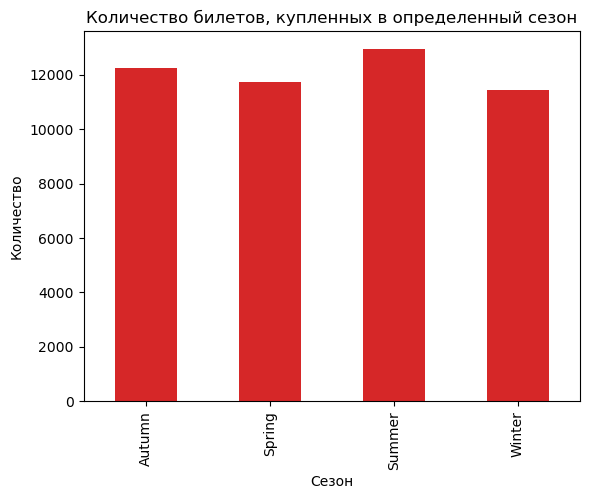

In [62]:
#построим график распределения числа пассажиров в каждый из сезонов
df.groupby('season').count()[['Flight_date_loc']].plot(kind='bar', color='C3',title='Количество билетов, купленных в определенный сезон', xlabel='Сезон',ylabel='Количество',legend=False)

По графику видно, что в целом число соврешенных покупок стабильно в каждый из сезонов. Наибольшее число билетов покупается в летнее время.

Посмотрим, как меняется средняя цена на билет.

<AxesSubplot:title={'center':'Средняя стоимость билета, купленного в определенный сезон'}, xlabel='Сезон', ylabel='Цена'>

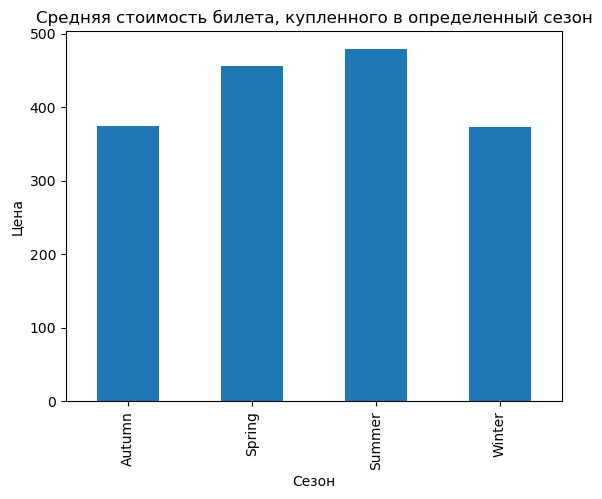

In [63]:
df.groupby('season').mean()[['Revenue_amount']].plot(kind='bar', title='Средняя стоимость билета, купленного в определенный сезон', xlabel='Сезон',ylabel='Цена',legend=False)

По гистограмме видно, что наиболее высокая стоимость у билетов, купленных в летнее время. Однако, стоит также учитывать тот факт, что каждый из пассажиров покупал билеты на одни и те же рейсы в разное время, соответсвенно, их цена может отличаться. 

<AxesSubplot:title={'center':'Количество билетов, купленных в определенный сезон (по месяцам)'}, xlabel='Сезон', ylabel='Количество'>

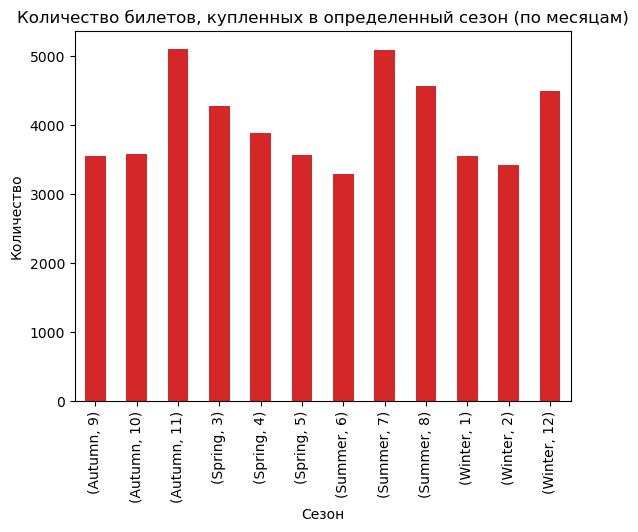

In [64]:
df.groupby(['season','Month']).count()[['Route_flight_type']].plot(kind='bar', color='C3', title='Количество билетов, купленных в определенный сезон (по месяцам)', xlabel='Сезон',ylabel='Количество',legend=False)

Если проследить динамику по месяцам, то видно, что наибольшее число покупок билетов осуществляется летом в июне, осенью в октябре, а также зимой в декабре (данные за 2 года по месяцам объединены). Данные особенности обусловлены - празниками, началом учебного года и отпусками.

#### Проверка гипотезы о том, что выручка от продаж осенью и зимой отличается.

H0: средняя выручка от продаж осенью и зимой не отличается.

H1: средняя выручка от продаж осенью и зимой отличается.

Перед тем, как проверить гипотезу и выбрать способ проверки, убедимся в том, что выборка не имеет нормального распределения (об этом уже было сказано в 3.2, продублирую), сначала посмотрим, соответствует ли распределение норальному виду.

In [65]:
df['Revenue_amount'].describe()

count    48375.000000
mean       421.941085
std        178.547873
min         10.000000
25%        280.000000
50%        400.000000
75%        540.000000
max        940.000000
Name: Revenue_amount, dtype: float64

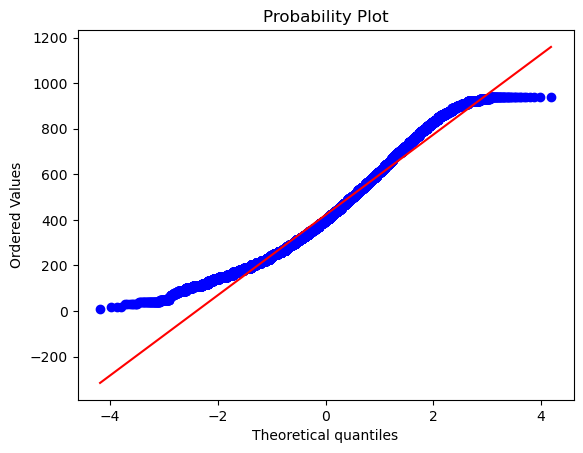

In [66]:
#построим Q-Q график
st.probplot(df['Revenue_amount'], dist='norm', plot=plt)
plt.show()

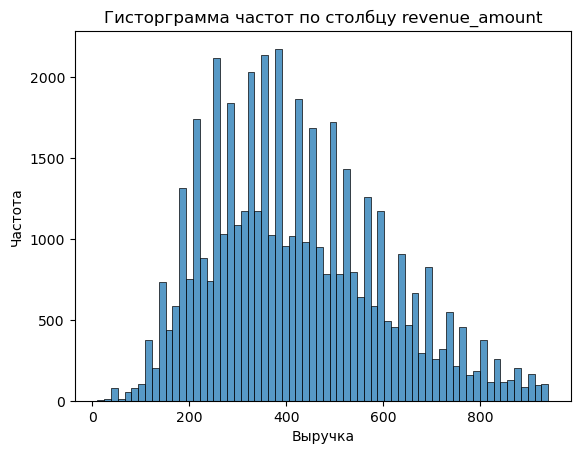

In [67]:
#построим гистограмму частот 
sns.histplot(data=df['Revenue_amount']).set(title='Гисторграмма частот по столбцу revenue_amount', ylabel='Частота',
                                                                               xlabel='Выручка')
plt.show()

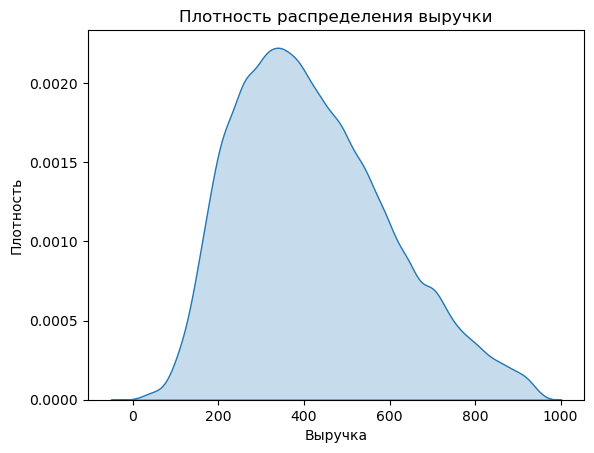

In [68]:
sns.kdeplot(df['Revenue_amount'], fill=True).set(title='Плотность распределения выручки',
                                                                 xlabel='Выручка', 
                                                                 ylabel='Плотность')
plt.show()

На основании плотности распределения и QQ-plotа можно сделать вывод, что распределение данных о выручке не имеет нормальный вид. Нам необходимо использовать в таком случае непараметрический тест Уилкоксона-Манна-Уитни.

In [69]:
#для начала создадим две выборки, в которые загрузим все данные о выручке в каждый из сезонов.

In [70]:
df_winter = df[df['season'] == 'Winter']['Revenue_amount'].values.tolist()
df_autumn = df[df['season'] == 'Autumn']['Revenue_amount'].values.tolist()
print(np.mean(df_autumn))
print(np.mean(df_winter))

374.9726374254676
372.49388966480444


In [71]:
alpha = 0.05 # уровень статистической значимости
         
# проводим тест Уилкоксона-Манна-Уитни
results = st.mannwhitneyu(df_winter, df_autumn)

print('p-value:', results.pvalue)

# формулируем результаты
if results.pvalue < alpha:
    print('Отклоняем нулевуюю гипотезу')
else:
    print('Нет оснований отклонить нулевую гипотезу')

p-value: 0.4549933504837227
Нет оснований отклонить нулевую гипотезу


Таким образом, можно сделать вывод, что средняя выручка от продаж осенью и зимой не отличается.

#### Теперь исследуем выручку и число продаж по месяцам, проверим корреляцию.

Для исследования будем использовать коэффициент ранговой корреляции Спирмена, так как распределение не является нормальным (можно также использовать коэффициент Кендела). 

In [72]:
#составим таблицу, в которую занесем число продаж по месяцам
issue_date_count = df.groupby(['Month']).count()[['Issue_date']]
issue_date_count.reset_index(inplace=True)
issue_date_count

,Month,Issue_date
0,1,3552
1,2,3414
2,3,4275
3,4,3887
4,5,3563
5,6,3287
6,7,5093
7,8,4571
8,9,3555
9,10,3579


In [73]:
#Проведем корреляционный анализ
rho, p = spearmanr(issue_date_count['Month'], issue_date_count['Issue_date'])

#ранговая корреляция Спирмена и p-значение
print(rho)
print(p)


0.5314685314685316
0.07536233505348364


<AxesSubplot:xlabel='Month', ylabel='Issue_date'>

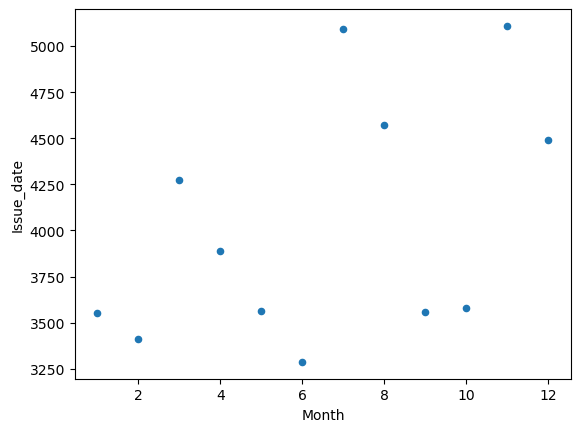

In [74]:
#Визуализируем эту зависимость
issue_date_count.plot('Month', 'Issue_date', kind = 'scatter')

Коэффициент корреляции Спирмена равен 0,53, это говорит о том, что связь между исследуемым фактором и результатом близка к умеренной. То есть связь между числом продаж и месяцом есть - умеренная. Значения криетрия p = 0,0754, говорит о том, что корреляция статистически значима (>0,05). 

In [75]:
#составим таблицу, в которую занесем суммарную выручку по месяцам
df_revenue = df.groupby(['Month']).sum()[['Revenue_amount']]
df_revenue.reset_index(inplace=True)
df_revenue

,Month,Revenue_amount
0,1,1304090
1,2,1297190
2,3,1759960
3,4,1934200
4,5,1651680
5,6,1538600
6,7,2447960
7,8,2220920
8,9,1542980
9,10,1280870


In [76]:
#Проведем корреляционный анализ
rho, p = spearmanr(df_revenue['Revenue_amount'], df_revenue['Month'])

#ранговая корреляция Спирмена и p-значение
print(rho)
print(p)


0.1958041958041958
0.5419358857313175


<AxesSubplot:xlabel='Month', ylabel='Revenue_amount'>

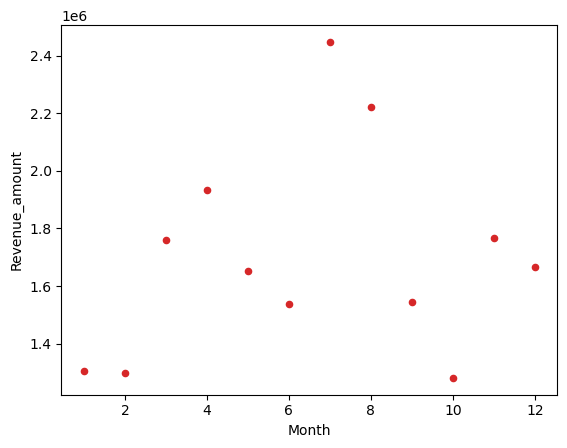

In [77]:
#Визуализируем эту зависимость
df_revenue.plot('Month', 'Revenue_amount', kind = 'scatter', color='C3')

Коэффициент корреляции равен 0,1958, это говорит о том, что зависимости между данными нет. То есть величина суммарной выручки не зависит от месяца ее получения. Значение p-корреляции = 0,54 (>0,05), значит критерий статистически значим.

In [78]:
#составим таблицу, в которую занесем среднюю выручку по месяцам
df_revenue_mean = df.groupby(['Month']).mean()[['Revenue_amount']]
df_revenue_mean.reset_index(inplace=True)
df_revenue_mean

,Month,Revenue_amount
0,1,367.142455
1,2,379.961921
2,3,411.686550
3,4,497.607409
4,5,463.564412
5,6,468.086401
6,7,480.651875
7,8,485.871800
8,9,434.030942
9,10,357.884884


In [79]:
#Проведем корреляционный анализ
rho, p = spearmanr(df_revenue_mean['Month'], df_revenue_mean['Revenue_amount'])

#ранговая корреляция Спирмена и p-значение
print(rho)
print(p)

-0.2377622377622378
0.4568008526399232


<AxesSubplot:xlabel='Month', ylabel='Revenue_amount'>

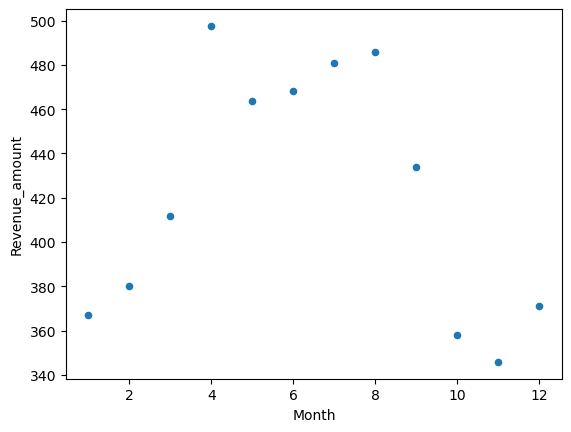

In [80]:
#Визуализируем эту зависимость
df_revenue_mean.plot('Month', 'Revenue_amount', kind = 'scatter')

Коэффициент корреляции равен -0,273, это говорит о том, что связь противоположная. То есть слабая отрицательная связь. Таким образом, связи между величиной средней выручки и месяцом ее получения очень слабая, к тому же еще и противоположная. Значение p-корреляции 0,4568, это говорит о том, что связь статистически значима.

Общий вывод: на основании полученных коэффициентов корреляции можно сделать вывод, что в целом нет никакой зависимости между выручкой компании и сезонности ее получения. 

### 3.4 Клиенты покупают билеты в разное время. Кто-то покупает билеты заранее, другие - в последний момент. Проверьте гипотезу о том, что выручка от продажи билетов для этих двух групп клиентов отличается. Предварительно разбейте клиентов минимум на три группы.

In [81]:
#добавим еще один столбец в данные - время, прошедшее с даты совершения покупки до даты полета.
df['time_since_purchase'] = (df['Flight_date_loc'] - df['Issue_date']).dt.days
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48375 entries, 0 to 48374
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Issue_date           48375 non-null  datetime64[ns]
 1   Flight_date_loc      48375 non-null  datetime64[ns]
 2   Pax_type             48375 non-null  object        
 3   Revenue_amount       48375 non-null  int64         
 4   Orig_city_code       48375 non-null  object        
 5   Dest_city_code       48375 non-null  object        
 6   Route_flight_type    48375 non-null  object        
 7   Ffp_flag             48375 non-null  object        
 8   Sale_type            48375 non-null  object        
 9   Day                  48375 non-null  int32         
 10  Month                48375 non-null  int32         
 11  Year                 48375 non-null  int32         
 12  Year_month           48375 non-null  object        
 13  season               48375 non-

In [82]:
#разобьем клиентов на 3 группы: заранее покупающие билеты, покупающие билеты вовремя, покупающие билеты в последний момент.
def recency(term):
    if term <= 30:
        return 'Поздно' #то есть за 30 дней до полета
    elif 30 <= term <= 60:
        return 'Оптимально' #то есть в интервале между 30 и 60 днями
    else:
        return 'Заранее'
df['time_since_purchase_mark'] = df['time_since_purchase'].apply(recency) #с помощью apply применяем функцию к стобцу 
df

,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type,Day,Month,Year,Year_month,season,time_since_purchase,time_since_purchase_mark
0,2021-12-07,2022-01-11,AD,200,MOW,KGD,ВВЛ,0,ONLINE,7,12,2021,2021.12,Winter,35,Оптимально
1,2021-12-31,2022-01-03,AD,610,UUS,OVB,ВВЛ,0,OFFLINE,31,12,2021,2021.12,Winter,3,Поздно
2,2021-11-28,2022-01-04,AD,390,KGD,MOW,ВВЛ,1,ONLINE,28,11,2021,2021.11,Autumn,37,Оптимально
3,2021-12-08,2022-01-05,AD,190,VOZ,MOW,ВВЛ,0,ONLINE,8,12,2021,2021.12,Winter,28,Поздно
4,2021-12-08,2022-01-12,AD,190,MOW,KRR,ВВЛ,1,OFFLINE,8,12,2021,2021.12,Winter,35,Оптимально
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48370,2022-06-11,2022-06-22,CHD,480,MOW,OMS,ВВЛ,0,ONLINE,11,6,2022,2022.6,Summer,11,Поздно
48371,2022-06-06,2022-06-20,AD,270,LED,MOW,ВВЛ,0,OFFLINE,6,6,2022,2022.6,Summer,14,Поздно
48372,2022-06-26,2022-06-29,AD,230,MOW,KZN,ВВЛ,1,ONLINE,26,6,2022,2022.6,Summer,3,Поздно
48373,2022-06-26,2022-06-28,AD,270,KZN,MOW,ВВЛ,0,OFFLINE,26,6,2022,2022.6,Summer,2,Поздно


Провека гипотезы:
    
H0:средняя выручка от продажи билетов в последний момент равна средней выручке от продажи билетов заранее.
    
H1:средняя выручка от продажи билетов в последний момент не равна средней выручке от продажи билетов заранее.

In [83]:
df_early = df[df['time_since_purchase_mark'] == 'Заранее']['Revenue_amount'].values.tolist()
df_late = df[df['time_since_purchase_mark'] == 'Поздно']['Revenue_amount'].values.tolist()

In [84]:
print(np.mean(df_early))
print(np.mean(df_late))

450.4922711058264
417.95376291195277


In [85]:
alpha = 0.05 # уровень статистической значимости
         
# проводим тест Уилкоксона-Манна-Уитни для сравнения двух независимых выборок
results = st.mannwhitneyu(df_early, df_late)

print('p-value:', results.pvalue)

# формулируем результаты
if results.pvalue < alpha:
    print('Отклоняем нулевуюю гипотезу')
else:
    print('Нет оснований отклонить нулевую гипотезу')

p-value: 1.3640411691900593e-41
Отклоняем нулевуюю гипотезу


Таким образом, средняя выручка по билетам, купленным заранее, отличается от средней выручки по билетам, купленным в последний момент. По подсчитанному выше среднему значению, скорее всего средняя выручка по заранее купленным билетам - выше. Посмотрим, почему так.

In [86]:
df.groupby(['time_since_purchase_mark']).count()[['Revenue_amount']]

,Revenue_amount
time_since_purchase_mark,
Заранее,4205
Оптимально,5543
Поздно,38627


Как видно, в целом люди чаще всего покупают билеты либо в течение 2-х месяцев до полета, либо в течение недели перед полетом. Заранее (то есть за 2 месяца до полета) купили билеты, в течение исследуемого периода, лишь 4205 человека. Это говорит о том, что пассажиры склонны осуществлять покупку ближе к дате полета. Обычно, билеты, купленные заранее, имеют более низкую стоимостью Возникает вопрос, почему тогда среднее значение выручки по данным билетам выше? 

In [87]:
df['Revenue_amount'][df['time_since_purchase_mark'] == 'Заранее'].describe()

count    4205.000000
mean      450.492271
std       169.391142
min        30.000000
25%       330.000000
50%       440.000000
75%       560.000000
max       940.000000
Name: Revenue_amount, dtype: float64

In [88]:
df['Revenue_amount'][df['time_since_purchase_mark'] == 'Поздно'].describe()

count    38627.000000
mean       417.953763
std        179.791101
min         20.000000
25%        280.000000
50%        390.000000
75%        530.000000
max        940.000000
Name: Revenue_amount, dtype: float64

Изучив данные по критерию времени, мы видим, что скорее всего данная особенность обусловлена числом элементов в выборке. Так как в случае покупки билетов в последний момент - число таких покупок гораздо больше, то из-за этого максимальные и минимальные значения цены нивилируются под воздействием большого числа средних по стоимости билетов. 

[Text(0.5, 1.0, 'Динамика средней стоимости билетов (в зависимости от количество прошедшего времени от даты покупки до даты полета'),
 Text(0.5, 0, 'Дата'),
 Text(0, 0.5, 'Средняя стоимость')]

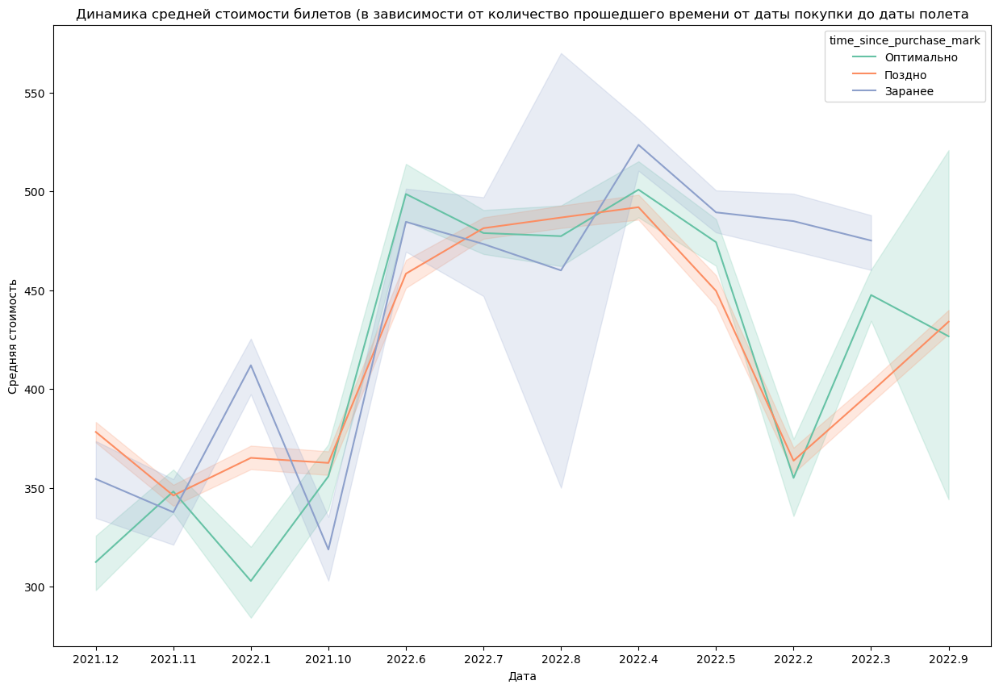

In [89]:
#построим графики
plt.figure(figsize=(15, 10))
sns.lineplot(data=df, x='Year_month', y='Revenue_amount', hue='time_since_purchase_mark',palette='Set2').set(title='Динамика средней стоимости билетов (в зависимости от количество прошедшего времени от даты покупки до даты полета', xlabel='Дата', ylabel='Средняя стоимость')

Как видно по графику, среднемесячная цена по билетам, купленным в разное время, в целом развивалась по одинаковой динамике. За исключением отдельных периодов. Так, например, в определенные периоды стоимость билетов, купленных в последний момент была ниже, чем для билетов, купленных заранее или во время, скорее всего были какие-то акции (горящие туры и билеты) или билетов осталось очень много (и цена на них понизилась). Так же видно, что в августе 2022 года сильный разброс между стоимостью билетов (купленных заранее), возможно, также были какие-то акционные предложения (или был период сгорания бонусов по программе лояльности).

Общий вывод:в целом средняя стоимость для билетов, купленных в разные периоды времени - отличается, на это оказывает влияние множество факторов: начия от акционных предложений, заканчивая сезонностью.

[Text(0.5, 1.0, 'Динамика средней стоимости билетов (в зависимости от количество прошедшего времени от даты покупки до даты полета) для ВВЛ'),
 Text(0.5, 0, 'Дата'),
 Text(0, 0.5, 'Средняя стоимость')]

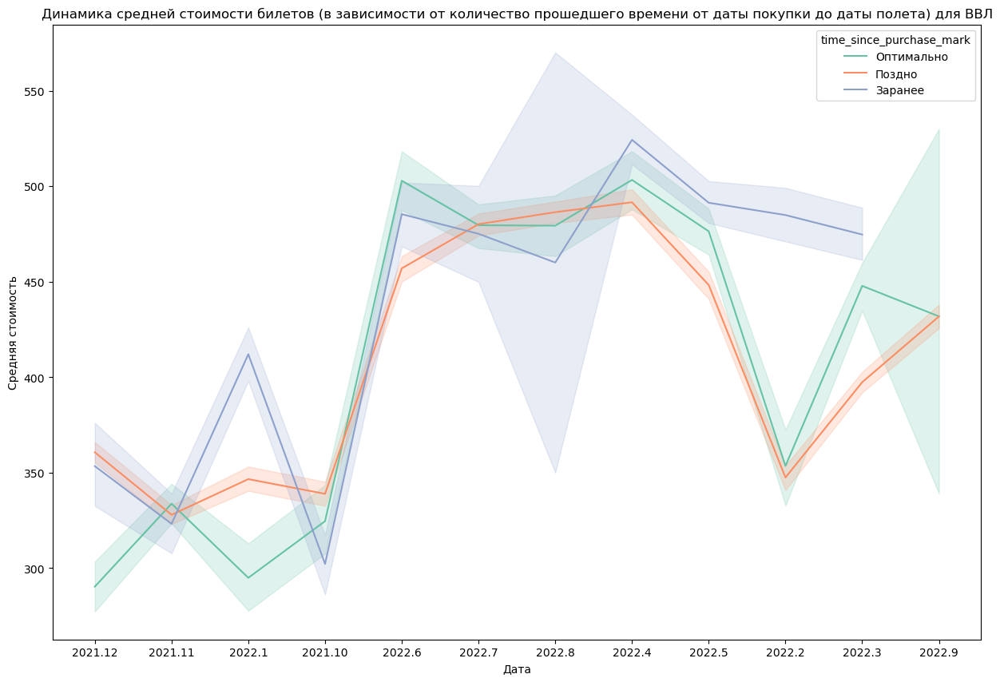

In [90]:
#построим графики
plt.figure(figsize=(15, 10))
sns.lineplot(data=df.loc[df['Route_flight_type']=='ВВЛ'], x='Year_month', y='Revenue_amount', hue='time_since_purchase_mark',palette='Set2').set(title='Динамика средней стоимости билетов (в зависимости от количество прошедшего времени от даты покупки до даты полета) для ВВЛ', xlabel='Дата', ylabel='Средняя стоимость')

[Text(0.5, 1.0, 'Динамика средней стоимости билетов (в зависимости от количество прошедшего времени от даты покупки до даты полета) для МВЛ'),
 Text(0.5, 0, 'Дата'),
 Text(0, 0.5, 'Средняя стоимость')]

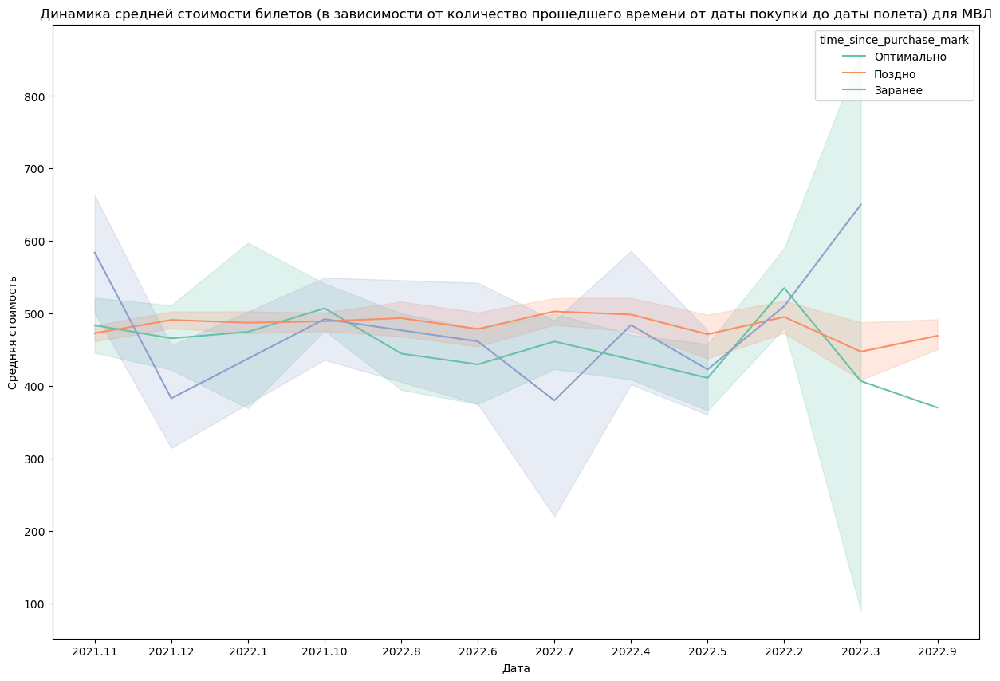

In [91]:
plt.figure(figsize=(15, 10))
sns.lineplot(data=df.loc[df['Route_flight_type']=='МВЛ'], x='Year_month', y='Revenue_amount', hue='time_since_purchase_mark',palette='Set2').set(title='Динамика средней стоимости билетов (в зависимости от количество прошедшего времени от даты покупки до даты полета) для МВЛ', xlabel='Дата', ylabel='Средняя стоимость')

Как видно по графикам: динамика для ВВЛ такая же, как и в общем виде(странно), для МВЛ цены на протяжении 2022 года были +- одинаковые (однако разброс стоимости заранее купленных билетов по прежнему - большой). В конце 2022 года резко возрасла средняя стоимость билетов купленных заранее.

### 3 .5 Определите топ-10 популярных направлений перелета (город-город) отдельно для ВМЛ и МВЛ. Изучите выручку для этих направлений. Для этого добавьте в датасет сведения о городах, используя данные из датасета:

In [92]:
#загружаем датасет
data = pd.read_csv('https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat',  names=['Index', 'Airport_Name', 'Location', 'Country', 'Orig_city_code', 'ICAO_Code', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Timezone_Region', 'Type', 'Source'])
data

,Index,Airport_Name,Location,Country,Orig_city_code,ICAO_Code,Latitude,Longitude,Altitude,Timezone,DST,Timezone_Region,Type,Source
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10,U,Pacific/Port_Moresby,airport,OurAirports
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7693,14106,Rogachyovo Air Base,Belaya,Russia,\N,ULDA,71.616699,52.478298,272,\N,\N,\N,airport,OurAirports
7694,14107,Ulan-Ude East Airport,Ulan Ude,Russia,\N,XIUW,51.849998,107.737999,1670,\N,\N,\N,airport,OurAirports
7695,14108,Krechevitsy Air Base,Novgorod,Russia,\N,ULLK,58.625000,31.385000,85,\N,\N,\N,airport,OurAirports
7696,14109,Desierto de Atacama Airport,Copiapo,Chile,CPO,SCAT,-27.261200,-70.779198,670,\N,\N,\N,airport,OurAirports


Проведя анализ, и совершив ошибки при загружении датасета, был сделан вывод, что некоторые города, в частности Москва, теряются, из-за чего датасет сильно сокращается. Поэтому необходимо восстановить данные. Логично, это сделать по коду аэропорта - так как это единственное, что связывает два датасета. Так как в загруженном датасете пропущены коды в некоторых строках, попробуем их восстановить по городу, в котором находится аэропорт с данным кодом. То есть из исходного датасета вытащим коды, которых нет в загруженном и по городу добавим их.

In [93]:
#вытаскиваем значения уникальных кодов из загруженного датасета
data_unique_code = data['Orig_city_code'].unique().tolist()

In [94]:
#вытаскиваем значения уникальных кодов из ранее исследуемого датасета
df_unique_code = df['Orig_city_code'].unique().tolist()

In [95]:
df_unique_code_1 = df['Dest_city_code'].unique().tolist()

In [96]:
#находим различия
set(df_unique_code) - set(data_unique_code)

{'BAK',
 'BER',
 'GRV',
 'LON',
 'MIL',
 'MOW',
 'NQZ',
 'OHH',
 'PAR',
 'ROM',
 'SEL',
 'TOX',
 'TYO'}

In [97]:
#находим различия
set(df_unique_code_1) - set(data_unique_code)

{'BAK',
 'BER',
 'GRV',
 'LON',
 'MIL',
 'MOW',
 'NQZ',
 'PAR',
 'ROM',
 'SEL',
 'TOX',
 'TYO'}

In [98]:
#создадим таблицу
df1 = pd.DataFrame({'Orig_city_code': ['BAK',
 'BER',
 'GRV',
 'LON',
 'MIL',
 'MOW',
 'NQZ',
 'OHH',
 'PAR',
 'ROM',
 'SEL',
 'TOX',
 'TYO'], 
 'Location':['Baku','Berlin','Grozny','London','Milan','Moscow','Astana','Okha','Paris', 'Rome','Seoul','Tobolsk','Tokyo']})
df1


,Orig_city_code,Location
0,BAK,Baku
1,BER,Berlin
2,GRV,Grozny
3,LON,London
4,MIL,Milan
5,MOW,Moscow
6,NQZ,Astana
7,OHH,Okha
8,PAR,Paris
9,ROM,Rome


Вроде бы все замечательно. ОДНАКО! Оказывается, что в городах бывает несколько аэропортов, из-за чего каждый рейс при такой замене - дублируется. Соотвественно, нужно как-то избавится от данной ситуации. Есть два варианта, как мне кажется.
1. Принебречь другими аэропортами и оставить только один. Так как по исходному датасету мы никак не можем восстановить какой именно аэропорт указан в билете.
2. Удалить после добавления дубликаты по маршруту, дню отправления, покупки билета и другим параметрам.

In [99]:
data.loc[data['Location'] == 'Paris']

,Index,Airport_Name,Location,Country,Orig_city_code,ICAO_Code,Latitude,Longitude,Altitude,Timezone,DST,Timezone_Region,Type,Source
1344,1380,Paris-Le Bourget Airport,Paris,France,LBG,LFPB,48.969398,2.441390,218,1,E,Europe/Paris,airport,OurAirports
1346,1382,Charles de Gaulle International Airport,Paris,France,CDG,LFPG,49.012798,2.550000,392,1,E,Europe/Paris,airport,OurAirports
1350,1386,Paris-Orly Airport,Paris,France,ORY,LFPO,48.723333,2.379444,291,1,E,Europe/Paris,airport,OurAirports
6857,11095,Cox Field,Paris,United States,PRX,KPRX,33.636600,-95.450798,547,-5,A,\N,airport,OurAirports


In [100]:
data.loc[data['Location'] == 'London']

,Index,Airport_Name,Location,Country,Orig_city_code,ICAO_Code,Latitude,Longitude,Altitude,Timezone,DST,Timezone_Region,Type,Source
172,174,London Airport,London,Canada,YXU,CYXU,43.035599,-81.153900,912,-5,A,America/Toronto,airport,OurAirports
487,492,London Luton Airport,London,United Kingdom,LTN,EGGW,51.874699,-0.368333,526,0,E,Europe/London,airport,OurAirports
497,502,London Gatwick Airport,London,United Kingdom,LGW,EGKK,51.148102,-0.190278,202,0,E,Europe/London,airport,OurAirports
498,503,London City Airport,London,United Kingdom,LCY,EGLC,51.505299,0.055278,19,0,E,Europe/London,airport,OurAirports
502,507,London Heathrow Airport,London,United Kingdom,LHR,EGLL,51.470600,-0.461941,83,0,E,Europe/London,airport,OurAirports
542,548,London Stansted Airport,London,United Kingdom,STN,EGSS,51.884998,0.235000,348,0,E,Europe/London,airport,OurAirports
5766,7722,London Heliport,London,United Kingdom,\N,EGLW,51.469723,-0.179444,18,0,E,Europe/London,airport,OurAirports
6141,8410,London-Corbin Airport/Magee Field,London,United States,LOZ,KLOZ,37.082199,-84.084900,1212,-5,A,America/New_York,airport,OurAirports
6759,10169,Madison County Airport,London,United States,\N,KUYF,39.932701,-83.461998,1082,-5,A,\N,airport,OurAirports


In [101]:
data.loc[data['Location'] == 'Milan']

,Index,Airport_Name,Location,Country,Orig_city_code,ICAO_Code,Latitude,Longitude,Altitude,Timezone,DST,Timezone_Region,Type,Source
1489,1529,Milano Linate Airport,Milan,Italy,LIN,LIML,45.445099,9.27674,353,1,E,Europe/Rome,airport,OurAirports


In [102]:
data.loc[data['Location'] == 'Seoul']

,Index,Airport_Name,Location,Country,Orig_city_code,ICAO_Code,Latitude,Longitude,Altitude,Timezone,DST,Timezone_Region,Type,Source
2271,2378,Gimpo International Airport,Seoul,South Korea,GMP,RKSS,37.558300,126.791000,59,9,U,Asia/Seoul,airport,OurAirports
3725,3930,Incheon International Airport,Seoul,South Korea,ICN,RKSI,37.469101,126.450996,23,9,U,Asia/Seoul,airport,OurAirports


In [103]:
#заменяем пропущенные значения и проверяем остались ли пропуски
for i in range(len(data)):
    for _ in range(len(df1)):
        if data.at[i,'Location'] == df1.at[_,'Location']:
            data.at[i,'Orig_city_code'] = df1.at[_,'Orig_city_code']
data[data['Location'] == 'Berlin']
        

,Index,Airport_Name,Location,Country,Orig_city_code,ICAO_Code,Latitude,Longitude,Altitude,Timezone,DST,Timezone_Region,Type,Source
333,337,Berlin-Schönefeld Airport,Berlin,Germany,BER,EDDB,52.380001,13.5225,157,1,E,Europe/Berlin,airport,OurAirports
339,343,Berlin-Tempelhof International Airport,Berlin,Germany,BER,EDDI,52.473000,13.4039,167,1,E,Europe/Berlin,airport,OurAirports
347,351,Berlin-Tegel Airport,Berlin,Germany,BER,EDDT,52.559700,13.2877,122,1,E,Europe/Berlin,airport,OurAirports


In [104]:
#создаем датасет с необходимыми столбцами из ранее загруженного (город отправления по аэропорту), столбцы Latitude и Longitude будут использованы в пункте 3.6.
data_new = data[['Location','Country','Airport_Name','Orig_city_code','Latitude','Longitude']]
data_new = data_new.drop_duplicates(subset=['Location','Orig_city_code']).reset_index(drop=True)
data_new

,Location,Country,Airport_Name,Orig_city_code,Latitude,Longitude
0,Goroka,Papua New Guinea,Goroka Airport,GKA,-6.081690,145.391998
1,Madang,Papua New Guinea,Madang Airport,MAG,-5.207080,145.789001
2,Mount Hagen,Papua New Guinea,Mount Hagen Kagamuga Airport,HGU,-5.826790,144.296005
3,Nadzab,Papua New Guinea,Nadzab Airport,LAE,-6.569803,146.725977
4,Port Moresby,Papua New Guinea,Port Moresby Jacksons International Airport,POM,-9.443380,147.220001
...,...,...,...,...,...,...
7623,Belaya,Russia,Rogachyovo Air Base,\N,71.616699,52.478298
7624,Ulan Ude,Russia,Ulan-Ude East Airport,\N,51.849998,107.737999
7625,Novgorod,Russia,Krechevitsy Air Base,\N,58.625000,31.385000
7626,Copiapo,Chile,Desierto de Atacama Airport,CPO,-27.261200,-70.779198


Замечаем, что число строк уменьшилось. Так произошло из-за того, что не все коды смогли восстановиться. Так, например, в data не было информации о городе Okha.

In [105]:
data_new[data_new['Location']=='Okha']

,Location,Country,Airport_Name,Orig_city_code,Latitude,Longitude


In [106]:
#тоже самое дляя города прибытия
data = data_new.rename(columns={'Orig_city_code': 'Dest_city_code'})
data

,Location,Country,Airport_Name,Dest_city_code,Latitude,Longitude
0,Goroka,Papua New Guinea,Goroka Airport,GKA,-6.081690,145.391998
1,Madang,Papua New Guinea,Madang Airport,MAG,-5.207080,145.789001
2,Mount Hagen,Papua New Guinea,Mount Hagen Kagamuga Airport,HGU,-5.826790,144.296005
3,Nadzab,Papua New Guinea,Nadzab Airport,LAE,-6.569803,146.725977
4,Port Moresby,Papua New Guinea,Port Moresby Jacksons International Airport,POM,-9.443380,147.220001
...,...,...,...,...,...,...
7623,Belaya,Russia,Rogachyovo Air Base,\N,71.616699,52.478298
7624,Ulan Ude,Russia,Ulan-Ude East Airport,\N,51.849998,107.737999
7625,Novgorod,Russia,Krechevitsy Air Base,\N,58.625000,31.385000
7626,Copiapo,Chile,Desierto de Atacama Airport,CPO,-27.261200,-70.779198


In [107]:
data_new_2 = data[['Location','Country','Airport_Name','Dest_city_code','Latitude','Longitude']]
data_new_2

,Location,Country,Airport_Name,Dest_city_code,Latitude,Longitude
0,Goroka,Papua New Guinea,Goroka Airport,GKA,-6.081690,145.391998
1,Madang,Papua New Guinea,Madang Airport,MAG,-5.207080,145.789001
2,Mount Hagen,Papua New Guinea,Mount Hagen Kagamuga Airport,HGU,-5.826790,144.296005
3,Nadzab,Papua New Guinea,Nadzab Airport,LAE,-6.569803,146.725977
4,Port Moresby,Papua New Guinea,Port Moresby Jacksons International Airport,POM,-9.443380,147.220001
...,...,...,...,...,...,...
7623,Belaya,Russia,Rogachyovo Air Base,\N,71.616699,52.478298
7624,Ulan Ude,Russia,Ulan-Ude East Airport,\N,51.849998,107.737999
7625,Novgorod,Russia,Krechevitsy Air Base,\N,58.625000,31.385000
7626,Copiapo,Chile,Desierto de Atacama Airport,CPO,-27.261200,-70.779198


In [108]:
set(df_unique_code) - set(data_new_2['Dest_city_code'].unique().tolist())

{'NQZ', 'OHH', 'TOX'}

In [109]:
#добавляем с исходные данные расшифровки. Из ранее загруженного датасета достаем столбцы с городом, в котором находится аэропорт по его коду, и через функцию добавляем этот столбец в данные.
df_new = df.merge(data_new, on='Orig_city_code')
df_new

,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type,Day,...,Year,Year_month,season,time_since_purchase,time_since_purchase_mark,Location,Country,Airport_Name,Latitude,Longitude
0,2021-12-07,2022-01-11,AD,200,MOW,KGD,ВВЛ,0,ONLINE,7,...,2021,2021.12,Winter,35,Оптимально,Moscow,Russia,Sheremetyevo International Airport,55.972599,37.414600
1,2021-12-08,2022-01-12,AD,190,MOW,KRR,ВВЛ,1,OFFLINE,8,...,2021,2021.12,Winter,35,Оптимально,Moscow,Russia,Sheremetyevo International Airport,55.972599,37.414600
2,2021-11-29,2022-01-14,AD,250,MOW,DUS,МВЛ,0,ONLINE,29,...,2021,2021.11,Autumn,46,Оптимально,Moscow,Russia,Sheremetyevo International Airport,55.972599,37.414600
3,2021-12-03,2022-01-06,AD,200,MOW,PEE,ВВЛ,1,ONLINE,3,...,2021,2021.12,Winter,34,Оптимально,Moscow,Russia,Sheremetyevo International Airport,55.972599,37.414600
4,2021-11-28,2022-01-07,CHD,70,MOW,AER,ВВЛ,1,ONLINE,28,...,2021,2021.11,Autumn,40,Оптимально,Moscow,Russia,Sheremetyevo International Airport,55.972599,37.414600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48351,2021-10-25,2021-11-10,AD,420,RHO,MOW,МВЛ,1,ONLINE,25,...,2021,2021.10,Autumn,16,Поздно,Rhodos,Greece,Diagoras Airport,36.405399,28.086201
48352,2021-10-01,2021-10-18,AD,580,RHO,MOW,МВЛ,0,ONLINE,1,...,2021,2021.10,Autumn,17,Поздно,Rhodos,Greece,Diagoras Airport,36.405399,28.086201
48353,2021-11-02,2021-11-03,AD,180,FRA,HER,МВЛ,0,ONLINE,2,...,2021,2021.11,Autumn,1,Поздно,Frankfurt,Germany,Frankfurt am Main Airport,50.033333,8.570556
48354,2021-10-06,2021-10-17,AD,710,CMN,MOW,МВЛ,1,ONLINE,6,...,2021,2021.10,Autumn,11,Поздно,Casablanca,Morocco,Mohammed V International Airport,33.367500,-7.589970


In [110]:
#аналогично, получаем конечный результат с городом отправления и прибытия. Как видно, датасет сократился, это из-за того, что у некоторых городов был пропущен оригинальный код, восстановить который невозможно.
df_new = df_new.merge(data_new_2, on='Dest_city_code')
df_new

,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type,Day,...,Location_x,Country_x,Airport_Name_x,Latitude_x,Longitude_x,Location_y,Country_y,Airport_Name_y,Latitude_y,Longitude_y
0,2021-12-07,2022-01-11,AD,200,MOW,KGD,ВВЛ,0,ONLINE,7,...,Moscow,Russia,Sheremetyevo International Airport,55.972599,37.414600,Kaliningrad,Russia,Khrabrovo Airport,54.889999,20.592600
1,2021-12-04,2022-01-07,CHD,180,MOW,KGD,ВВЛ,0,ONLINE,4,...,Moscow,Russia,Sheremetyevo International Airport,55.972599,37.414600,Kaliningrad,Russia,Khrabrovo Airport,54.889999,20.592600
2,2021-12-14,2022-01-10,AD,120,MOW,KGD,ВВЛ,1,ONLINE,14,...,Moscow,Russia,Sheremetyevo International Airport,55.972599,37.414600,Kaliningrad,Russia,Khrabrovo Airport,54.889999,20.592600
3,2021-12-05,2022-01-05,AD,250,MOW,KGD,ВВЛ,1,ONLINE,5,...,Moscow,Russia,Sheremetyevo International Airport,55.972599,37.414600,Kaliningrad,Russia,Khrabrovo Airport,54.889999,20.592600
4,2021-10-30,2021-11-03,CHD,250,MOW,KGD,ВВЛ,0,ONLINE,30,...,Moscow,Russia,Sheremetyevo International Airport,55.972599,37.414600,Kaliningrad,Russia,Khrabrovo Airport,54.889999,20.592600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48325,2022-03-08,2022-03-10,AD,300,BKK,DOH,МВЛ,0,ONLINE,8,...,Bangkok,Thailand,Suvarnabhumi Airport,13.681100,100.747002,Doha,Qatar,Hamad International Airport,25.273056,51.608056
48326,2022-03-15,2022-03-17,AD,360,BKK,DOH,МВЛ,0,ONLINE,15,...,Bangkok,Thailand,Suvarnabhumi Airport,13.681100,100.747002,Doha,Qatar,Hamad International Airport,25.273056,51.608056
48327,2021-11-19,2022-01-02,AD,500,BKK,USM,МВЛ,0,OFFLINE,19,...,Bangkok,Thailand,Suvarnabhumi Airport,13.681100,100.747002,Ko Samui,Thailand,Samui Airport,9.547790,100.061996
48328,2022-01-22,2022-01-23,AD,720,IST,MCT,МВЛ,0,OFFLINE,22,...,Istanbul,Turkey,Istanbul Airport,41.275278,28.751944,Muscat,Oman,Muscat International Airport,23.593300,58.284401


Таким образом, размер исходного датасета сократился незначительно, как раз из-за той проблемы, о которой было написано выше.

In [111]:
#посчитаем расстояние между пунктом отправления и прибытия для корреляции пункта 3.6. и визуализации пункта 3.5.
df_new['mlat'] = np.radians(df_new['Longitude_y'])
df_new['mlon'] = np.radians(df_new['Longitude_x'])
df_new['plat'] = np.radians(df_new['Latitude_x'])
df_new['plon'] = np.radians(df_new['Latitude_y'])
df_new['Dist'] = 6371.01 * np.arccos(np.sin(df_new['plat'])*np.sin(df_new['plon']) + np.cos(df_new['plon'])*np.cos(df_new['plat'])*np.cos(df_new['mlat'] - df_new['mlon']))
df_new



,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type,Day,...,Location_y,Country_y,Airport_Name_y,Latitude_y,Longitude_y,mlat,mlon,plat,plon,Dist
0,2021-12-07,2022-01-11,AD,200,MOW,KGD,ВВЛ,0,ONLINE,7,...,Kaliningrad,Russia,Khrabrovo Airport,54.889999,20.592600,0.359409,0.653008,0.976906,0.958011,1065.441020
1,2021-12-04,2022-01-07,CHD,180,MOW,KGD,ВВЛ,0,ONLINE,4,...,Kaliningrad,Russia,Khrabrovo Airport,54.889999,20.592600,0.359409,0.653008,0.976906,0.958011,1065.441020
2,2021-12-14,2022-01-10,AD,120,MOW,KGD,ВВЛ,1,ONLINE,14,...,Kaliningrad,Russia,Khrabrovo Airport,54.889999,20.592600,0.359409,0.653008,0.976906,0.958011,1065.441020
3,2021-12-05,2022-01-05,AD,250,MOW,KGD,ВВЛ,1,ONLINE,5,...,Kaliningrad,Russia,Khrabrovo Airport,54.889999,20.592600,0.359409,0.653008,0.976906,0.958011,1065.441020
4,2021-10-30,2021-11-03,CHD,250,MOW,KGD,ВВЛ,0,ONLINE,30,...,Kaliningrad,Russia,Khrabrovo Airport,54.889999,20.592600,0.359409,0.653008,0.976906,0.958011,1065.441020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48325,2022-03-08,2022-03-10,AD,300,BKK,DOH,МВЛ,0,ONLINE,8,...,Doha,Qatar,Hamad International Airport,25.273056,51.608056,0.900730,1.758367,0.238780,0.441098,5279.970643
48326,2022-03-15,2022-03-17,AD,360,BKK,DOH,МВЛ,0,ONLINE,15,...,Doha,Qatar,Hamad International Airport,25.273056,51.608056,0.900730,1.758367,0.238780,0.441098,5279.970643
48327,2021-11-19,2022-01-02,AD,500,BKK,USM,МВЛ,0,OFFLINE,19,...,Ko Samui,Thailand,Samui Airport,9.547790,100.061996,1.746411,1.758367,0.238780,0.166640,465.617418
48328,2022-01-22,2022-01-23,AD,720,IST,MCT,МВЛ,0,OFFLINE,22,...,Muscat,Oman,Muscat International Airport,23.593300,58.284401,1.017255,0.501816,0.720390,0.411781,3370.728753


In [112]:
#созданим столбец по типу город отправления - город прибытия
df_new['City_trip'] = df_new['Location_x'] + '-' + df_new['Location_y']

In [113]:
#избавимся от ненужных столбцов
df_new.drop(['mlat','mlon','plat','plon'], axis= 1 , inplace= True )
df_new

,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Orig_city_code,Dest_city_code,Route_flight_type,Ffp_flag,Sale_type,Day,...,Airport_Name_x,Latitude_x,Longitude_x,Location_y,Country_y,Airport_Name_y,Latitude_y,Longitude_y,Dist,City_trip
0,2021-12-07,2022-01-11,AD,200,MOW,KGD,ВВЛ,0,ONLINE,7,...,Sheremetyevo International Airport,55.972599,37.414600,Kaliningrad,Russia,Khrabrovo Airport,54.889999,20.592600,1065.441020,Moscow-Kaliningrad
1,2021-12-04,2022-01-07,CHD,180,MOW,KGD,ВВЛ,0,ONLINE,4,...,Sheremetyevo International Airport,55.972599,37.414600,Kaliningrad,Russia,Khrabrovo Airport,54.889999,20.592600,1065.441020,Moscow-Kaliningrad
2,2021-12-14,2022-01-10,AD,120,MOW,KGD,ВВЛ,1,ONLINE,14,...,Sheremetyevo International Airport,55.972599,37.414600,Kaliningrad,Russia,Khrabrovo Airport,54.889999,20.592600,1065.441020,Moscow-Kaliningrad
3,2021-12-05,2022-01-05,AD,250,MOW,KGD,ВВЛ,1,ONLINE,5,...,Sheremetyevo International Airport,55.972599,37.414600,Kaliningrad,Russia,Khrabrovo Airport,54.889999,20.592600,1065.441020,Moscow-Kaliningrad
4,2021-10-30,2021-11-03,CHD,250,MOW,KGD,ВВЛ,0,ONLINE,30,...,Sheremetyevo International Airport,55.972599,37.414600,Kaliningrad,Russia,Khrabrovo Airport,54.889999,20.592600,1065.441020,Moscow-Kaliningrad
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48325,2022-03-08,2022-03-10,AD,300,BKK,DOH,МВЛ,0,ONLINE,8,...,Suvarnabhumi Airport,13.681100,100.747002,Doha,Qatar,Hamad International Airport,25.273056,51.608056,5279.970643,Bangkok-Doha
48326,2022-03-15,2022-03-17,AD,360,BKK,DOH,МВЛ,0,ONLINE,15,...,Suvarnabhumi Airport,13.681100,100.747002,Doha,Qatar,Hamad International Airport,25.273056,51.608056,5279.970643,Bangkok-Doha
48327,2021-11-19,2022-01-02,AD,500,BKK,USM,МВЛ,0,OFFLINE,19,...,Suvarnabhumi Airport,13.681100,100.747002,Ko Samui,Thailand,Samui Airport,9.547790,100.061996,465.617418,Bangkok-Ko Samui
48328,2022-01-22,2022-01-23,AD,720,IST,MCT,МВЛ,0,OFFLINE,22,...,Istanbul Airport,41.275278,28.751944,Muscat,Oman,Muscat International Airport,23.593300,58.284401,3370.728753,Istanbul-Muscat


In [114]:
#топ 10 популярных маршрутов для внутренних рейсов
df_VVL_trip = df_new[df_new['Route_flight_type'] == 'ВВЛ'].groupby(['City_trip']).count()[['Revenue_amount']].sort_values(by ='Revenue_amount', ascending=False).head(10)
df_VVL_trip.reset_index(inplace=True)
df_VVL_trip

,City_trip,Revenue_amount
0,Sochi-Moscow,1326
1,Moscow-Sochi,1292
2,St. Petersburg-Moscow,1211
3,Moscow-St. Petersburg,1190
4,Novosibirsk-Moscow,967
5,Moscow-Novosibirsk,944
6,Kazan-Moscow,759
7,Moscow-Kazan,757
8,Moscow-Ufa,708
9,Novosibirsk-Sochi,668


Самый популярный рейс:  Сочи - Москва.

In [115]:
#посчитаем также суммарную выручку по каждому направлению и добавим получившиеся значения в таблицу
df_VVL_trip_sum = df_new[df_new['Route_flight_type'] == 'ВВЛ'].groupby(['City_trip']).sum()[['Revenue_amount']].sort_values(by ='Revenue_amount', ascending=False)
df_VVL_trip = df_VVL_trip.merge(df_VVL_trip_sum, on='City_trip')
df_VVL_trip.columns=['City_trip','Number_flights','Sum_revenue']
df_VVL_trip

,City_trip,Number_flights,Sum_revenue
0,Sochi-Moscow,1326,513970
1,Moscow-Sochi,1292,480480
2,St. Petersburg-Moscow,1211,280870
3,Moscow-St. Petersburg,1190,273720
4,Novosibirsk-Moscow,967,460720
5,Moscow-Novosibirsk,944,440440
6,Kazan-Moscow,759,205230
7,Moscow-Kazan,757,204660
8,Moscow-Ufa,708,210610
9,Novosibirsk-Sochi,668,382470


Как видно, распределение по числу совершенных рейсов и суммарной выручки по ним для топ 10 отличаются. Так, рейс Новосибирск-Сочи, занимающий 10 место в топ 10 по числу совершенных рейсов, занимает 5 место в тор 10 по суммарной выручке. То есть можно сделать вывод, что средняя цена по данному маршруту выше чем по части маршрутов находящихся выше в топ 10 по числу совершенных рейсов. 
Отметим получившиеся результаты на карте.

In [116]:
#удалим ненужные столбцы
df_new_append = df_new[['City_trip','Airport_Name_x','Latitude_x','Longitude_x','Airport_Name_y','Latitude_y','Longitude_y','Dist']].drop_duplicates().reset_index(drop=True)

In [117]:
#созадим датасет для дальнейшего построения графиков
df_VVL_trip = df_VVL_trip.merge(df_new_append, on='City_trip')
df_VVL_trip 

,City_trip,Number_flights,Sum_revenue,Airport_Name_x,Latitude_x,Longitude_x,Airport_Name_y,Latitude_y,Longitude_y,Dist
0,Sochi-Moscow,1326,513970,Sochi International Airport,43.449902,39.956600,Sheremetyevo International Airport,55.972599,37.414600,1404.160284
1,Moscow-Sochi,1292,480480,Sheremetyevo International Airport,55.972599,37.414600,Sochi International Airport,43.449902,39.956600,1404.160284
2,St. Petersburg-Moscow,1211,280870,Pulkovo Airport,59.800301,30.262501,Sheremetyevo International Airport,55.972599,37.414600,599.289950
3,Moscow-St. Petersburg,1190,273720,Sheremetyevo International Airport,55.972599,37.414600,Pulkovo Airport,59.800301,30.262501,599.289950
4,Novosibirsk-Moscow,967,460720,Tolmachevo Airport,55.012600,82.650703,Sheremetyevo International Airport,55.972599,37.414600,2800.378734
5,Moscow-Novosibirsk,944,440440,Sheremetyevo International Airport,55.972599,37.414600,Tolmachevo Airport,55.012600,82.650703,2800.378734
6,Kazan-Moscow,759,205230,Kazan International Airport,55.606201,49.278702,Sheremetyevo International Airport,55.972599,37.414600,741.921989
7,Moscow-Kazan,757,204660,Sheremetyevo International Airport,55.972599,37.414600,Kazan International Airport,55.606201,49.278702,741.921989
8,Moscow-Ufa,708,210610,Sheremetyevo International Airport,55.972599,37.414600,Ufa International Airport,54.557499,55.874401,1176.485149
9,Novosibirsk-Sochi,668,382470,Tolmachevo Airport,55.012600,82.650703,Sochi International Airport,43.449902,39.956600,3292.761781


Отметим полученные данные на карте.

In [118]:
#вытащим названия столбцов
df_columns = df_VVL_trip.columns
df_columns

Index(['City_trip', 'Number_flights', 'Sum_revenue', 'Airport_Name_x',
       'Latitude_x', 'Longitude_x', 'Airport_Name_y', 'Latitude_y',
       'Longitude_y', 'Dist'],
      dtype='object')

In [119]:
#создадим список
df_columns_names = []
for i in range(10):
    f = df_VVL_trip[df_columns[i]].tolist()
    df_columns_names.append(f)
df_columns_names

[['Sochi-Moscow',
  'Moscow-Sochi',
  'St. Petersburg-Moscow',
  'Moscow-St. Petersburg',
  'Novosibirsk-Moscow',
  'Moscow-Novosibirsk',
  'Kazan-Moscow',
  'Moscow-Kazan',
  'Moscow-Ufa',
  'Novosibirsk-Sochi'],
 [1326, 1292, 1211, 1190, 967, 944, 759, 757, 708, 668],
 [513970,
  480480,
  280870,
  273720,
  460720,
  440440,
  205230,
  204660,
  210610,
  382470],
 ['Sochi International Airport',
  'Sheremetyevo International Airport',
  'Pulkovo Airport',
  'Sheremetyevo International Airport',
  'Tolmachevo Airport',
  'Sheremetyevo International Airport',
  'Kazan International Airport',
  'Sheremetyevo International Airport',
  'Sheremetyevo International Airport',
  'Tolmachevo Airport'],
 [43.449902,
  55.972599,
  59.80030059814453,
  55.972599,
  55.012599945068,
  55.972599,
  55.606201171875,
  55.972599,
  55.972599,
  55.012599945068],
 [39.9566,
  37.4146,
  30.262500762939453,
  37.4146,
  82.650703430176,
  37.4146,
  49.278701782227,
  37.4146,
  37.4146,
  82.6507

In [120]:
#отмечаем точки на карте
!pip install folium pandas
import folium as folium
m = folium.Map(location=[20,0], tiles="OpenStreetMap", zoom_start=2)
tooltip = "Нажми, чтобы узнать больше"
for i in range(0,10): #для пункта отправления
    marker = folium.Marker(
    location=[df_columns_names[4][i], df_columns_names[5][i]], #координаты
    popup=df_columns_names[3][i], #название аэропорта
    tooltip=tooltip) #кликабельность
    marker.add_to(m)
for i in range(0,10): #для пункта прибытия 
    marker = folium.Marker(
    location=[df_columns_names[7][i], df_columns_names[8][i]],
    popup=df_columns_names[6][i],
    tooltip=tooltip)
    marker.add_to(m)
m

In [121]:
#чтобы график был более понятен, зададим для каждого маршрута свой цвет
import random
number_of_colors = 10

color = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
             for i in range(number_of_colors)]
print(color)

['#C327DF', '#537FCF', '#C8CCD7', '#F13717', '#F23733', '#421633', '#575F0F', '#71DC3E', '#8FF916', '#5A33CA']


In [122]:
#отмечаем маршруты
for i in range(0,10):
    loc = [(df_columns_names[4][i], df_columns_names[5][i]), #координаты точек отправления и прибытия
    (df_columns_names[7][i],df_columns_names[8][i])]
#сообственно добавляем отрезки, соединяем точки
    folium.PolyLine(loc, #координаты точек 
                color=color[i], #цвет
                weight=1, #толщина
                   ).add_to(m) 
m

In [123]:
#по средней выручке
df_new_mean = df_new[df_new['Route_flight_type'] == 'ВВЛ'].groupby(['City_trip']).mean()[['Revenue_amount']].sort_values(by ='Revenue_amount', ascending=False).head(10)

<AxesSubplot:title={'center':'Средняя стоимость билета по рейсам'}, ylabel='Средняя стоимость'>

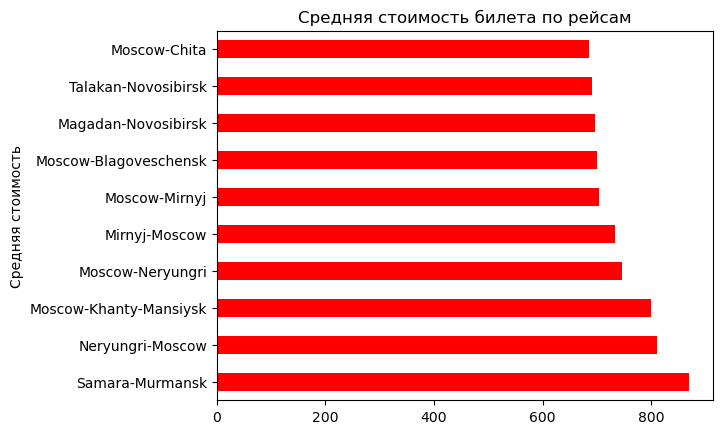

In [124]:
df_new_mean.plot(kind='barh', title='Средняя стоимость билета по рейсам', xlabel='Средняя стоимость', ylabel='Направление', color='red', legend=False)

Действительно, топ 10 изменился. Наиболее дорогие билеты по направлению Нижний Самара-Мурманск. В целом видно, что билеты в северо-восточном направлении наиболее дорогие.

Проделаем тоже самое с международными рейсами.

In [125]:
#топ 10 популярных маршрутов для международных рейсов
df_MVL_trip = df_new[df_new['Route_flight_type'] == 'МВЛ'].groupby(['City_trip']).count()[['Revenue_amount']].sort_values(by ='Revenue_amount', ascending=False).head(10)
df_MVL_trip.reset_index(inplace=True)
df_MVL_trip

,City_trip,Revenue_amount
0,Moscow-Osh,151
1,Khudzhand-Moscow,144
2,Osh-Moscow,136
3,Moscow-Khudzhand,129
4,Novosibirsk-Bishkek,120
5,Novosibirsk-Osh,119
6,Khudzhand-Novosibirsk,116
7,Osh-Novosibirsk,115
8,Bishkek-Novosibirsk,102
9,Moscow-Antalya,101


In [126]:
#топ 10 по суммарной выручке
df_MVL_trip_sum = df_new[df_new['Route_flight_type'] == 'МВЛ'].groupby(['City_trip']).sum()[['Revenue_amount']].sort_values(by ='Revenue_amount', ascending=False)
df_MVL_trip = df_MVL_trip.merge(df_MVL_trip_sum, on='City_trip')
df_MVL_trip.columns=['City_trip','Number_flights','Sum_revenue']
df_MVL_trip

,City_trip,Number_flights,Sum_revenue
0,Moscow-Osh,151,68130
1,Khudzhand-Moscow,144,95190
2,Osh-Moscow,136,80920
3,Moscow-Khudzhand,129,57710
4,Novosibirsk-Bishkek,120,46980
5,Novosibirsk-Osh,119,47450
6,Khudzhand-Novosibirsk,116,57740
7,Osh-Novosibirsk,115,56980
8,Bishkek-Novosibirsk,102,48300
9,Moscow-Antalya,101,38080


In [127]:
df_columns = df_MVL_trip.columns
df_columns

Index(['City_trip', 'Number_flights', 'Sum_revenue'], dtype='object')

In [128]:
#топ 10 по средней выручке
df_new[df_new['Route_flight_type'] == 'МВЛ'].groupby(['City_trip']).mean()[['Revenue_amount']].sort_values(by ='Revenue_amount', ascending=False).head(10)

,Revenue_amount
City_trip,
Phuket-Novosibirsk,900.000000
Chardzhou-Moscow,895.000000
Bahrain-Moscow,880.000000
Bangkok-Khabarovsk,850.000000
Novosibirsk-Phuket,827.500000
Khabarovsk-Bangkok,810.000000
Vladivostok-Osh,810.000000
Kurgan Tyube-Tyumen,786.666667
Vladivostok-Phuket,780.000000


Как видно, направления в каждом топе различные. Наиболее дорогие билеты из Новосибирска в Ригу. А чаще всего за исследуемый период люди летали из Москвы в Oш.

In [129]:
df_country = pd.DataFrame(df_new.groupby('Country_x').count()['Revenue_amount'])
df_country.reset_index(inplace=True)
df_country

,Country_x,Revenue_amount
0,Armenia,80
1,Austria,5
2,Azerbaijan,74
3,Bahrain,1
4,Belarus,46
5,Bulgaria,45
6,Canada,1
7,Croatia,5
8,Cyprus,17
9,Egypt,153


In [130]:
#созадим датасет для дальнейшего построения графиков
df_MVL_trip = df_MVL_trip.merge(df_new_append, on='City_trip')
df_MVL_trip 

,City_trip,Number_flights,Sum_revenue,Airport_Name_x,Latitude_x,Longitude_x,Airport_Name_y,Latitude_y,Longitude_y,Dist
0,Moscow-Osh,151,68130,Sheremetyevo International Airport,55.972599,37.414600,Osh Airport,40.609001,72.793297,3074.290311
1,Khudzhand-Moscow,144,95190,Khudzhand Airport,40.215401,69.694702,Sheremetyevo International Airport,55.972599,37.414600,2925.983261
2,Osh-Moscow,136,80920,Osh Airport,40.609001,72.793297,Sheremetyevo International Airport,55.972599,37.414600,3074.290311
3,Moscow-Khudzhand,129,57710,Sheremetyevo International Airport,55.972599,37.414600,Khudzhand Airport,40.215401,69.694702,2925.983261
4,Novosibirsk-Bishkek,120,46980,Tolmachevo Airport,55.012600,82.650703,Manas International Airport,43.061298,74.477600,1454.042602
5,Novosibirsk-Osh,119,47450,Tolmachevo Airport,55.012600,82.650703,Osh Airport,40.609001,72.793297,1758.681459
6,Khudzhand-Novosibirsk,116,57740,Khudzhand Airport,40.215401,69.694702,Tolmachevo Airport,55.012600,82.650703,1903.686339
7,Osh-Novosibirsk,115,56980,Osh Airport,40.609001,72.793297,Tolmachevo Airport,55.012600,82.650703,1758.681459
8,Bishkek-Novosibirsk,102,48300,Manas International Airport,43.061298,74.477600,Tolmachevo Airport,55.012600,82.650703,1454.042602
9,Moscow-Antalya,101,38080,Sheremetyevo International Airport,55.972599,37.414600,Antalya International Airport,36.898701,30.800501,2178.245093


In [131]:
#вытащим названия столбцов
df_columns = df_MVL_trip.columns
df_columns

Index(['City_trip', 'Number_flights', 'Sum_revenue', 'Airport_Name_x',
       'Latitude_x', 'Longitude_x', 'Airport_Name_y', 'Latitude_y',
       'Longitude_y', 'Dist'],
      dtype='object')

In [132]:
#создадим список
df_columns_names = []
for i in range(10):
    f = df_MVL_trip[df_columns[i]].tolist()
    df_columns_names.append(f)

In [133]:
#отмечаем точки на карте
d = folium.Map(location=[20,0], tiles="OpenStreetMap", zoom_start=2)
tooltip = "Нажми, чтобы узнать больше"
political_countries_url = (
       "http://geojson.xyz/naturalearth-3.3.0/ne_50m_admin_0_countries.geojson"
)
folium.Choropleth(
    geo_data = political_countries_url,   #метки территорий стран                  
    name = "Число рейсов",
    data = df_country, #датасет с списком нужных стран
    columns = ("Country_x", "Revenue_amount"), #собственно столбцы, в которых содержится информация о стране и числе совершенных рейсов
    key_on="feature.properties.name", #не знаю что,3 но без этого все черное
    fill_color = "YlGn",  #цвет
    fill_opacity = 0.7, #насыщенность
    line_opacity = 0.1,
    nan_fill_color="white", 
    legend_name = "Частота совершения перелетов %",
).add_to(d) 
folium.LayerControl().add_to(d)
for i in range(0,10):
    marker = folium.Marker(
    location=[df_columns_names[4][i], df_columns_names[5][i]],
    popup=df_columns_names[3][i],
    tooltip=tooltip)
    marker.add_to(d)
for i in range(0,10):
    marker = folium.Marker(
    location=[df_columns_names[7][i], df_columns_names[8][i]],
    popup=df_columns_names[6][i],
    tooltip=tooltip)
    marker.add_to(d)
#отмечаем маршруты
for i in range(0,10):
    loc = [(df_columns_names[4][i], df_columns_names[5][i]),
    (df_columns_names[7][i],df_columns_names[8][i])]
    folium.PolyLine(loc,
                color=color[i],
                weight=1,
                opacity=0.8).add_to(d)

d

### 3.6. Определите есть ли зависимость выручки от других признаков. Постройте матрицу корреляций.

Для того чтобы построить матрицу корреляций, поменяем значения в нужных столбцах на числовые данные.


In [134]:
df_new.drop(['Orig_city_code','Dest_city_code','time_since_purchase_mark','Country_x','Country_y','City_trip','Latitude_x','Latitude_y','Longitude_x','Longitude_y'], axis= 1 , inplace= True )


In [135]:
df = df_new

In [136]:
df['Week'] = df['Flight_date_loc'].dt.weekday.astype('int')
df

,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Route_flight_type,Ffp_flag,Sale_type,Day,Month,Year,Year_month,season,time_since_purchase,Location_x,Airport_Name_x,Location_y,Airport_Name_y,Dist,Week
0,2021-12-07,2022-01-11,AD,200,ВВЛ,0,ONLINE,7,12,2021,2021.12,Winter,35,Moscow,Sheremetyevo International Airport,Kaliningrad,Khrabrovo Airport,1065.441020,1
1,2021-12-04,2022-01-07,CHD,180,ВВЛ,0,ONLINE,4,12,2021,2021.12,Winter,34,Moscow,Sheremetyevo International Airport,Kaliningrad,Khrabrovo Airport,1065.441020,4
2,2021-12-14,2022-01-10,AD,120,ВВЛ,1,ONLINE,14,12,2021,2021.12,Winter,27,Moscow,Sheremetyevo International Airport,Kaliningrad,Khrabrovo Airport,1065.441020,0
3,2021-12-05,2022-01-05,AD,250,ВВЛ,1,ONLINE,5,12,2021,2021.12,Winter,31,Moscow,Sheremetyevo International Airport,Kaliningrad,Khrabrovo Airport,1065.441020,2
4,2021-10-30,2021-11-03,CHD,250,ВВЛ,0,ONLINE,30,10,2021,2021.10,Autumn,4,Moscow,Sheremetyevo International Airport,Kaliningrad,Khrabrovo Airport,1065.441020,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48325,2022-03-08,2022-03-10,AD,300,МВЛ,0,ONLINE,8,3,2022,2022.3,Spring,2,Bangkok,Suvarnabhumi Airport,Doha,Hamad International Airport,5279.970643,3
48326,2022-03-15,2022-03-17,AD,360,МВЛ,0,ONLINE,15,3,2022,2022.3,Spring,2,Bangkok,Suvarnabhumi Airport,Doha,Hamad International Airport,5279.970643,3
48327,2021-11-19,2022-01-02,AD,500,МВЛ,0,OFFLINE,19,11,2021,2021.11,Autumn,44,Bangkok,Suvarnabhumi Airport,Ko Samui,Samui Airport,465.617418,6
48328,2022-01-22,2022-01-23,AD,720,МВЛ,0,OFFLINE,22,1,2022,2022.1,Winter,1,Istanbul,Istanbul Airport,Muscat,Muscat International Airport,3370.728753,6


Зависимость между величиной средней выручки и днем недели.

In [137]:
#для того чтобы провести анализ сгруппируем данные
date_count = df.groupby(['Week']).count()[['Revenue_amount']]
date_count.reset_index(inplace=True)
date_count

,Week,Revenue_amount
0,0,6918
1,1,7027
2,2,6692
3,3,6723
4,4,7008
5,5,6964
6,6,6998


In [138]:
#Проведем корреляционный анализ
rho, p = spearmanr(date_count['Revenue_amount'], date_count['Week'])

#напечатать ранговая корреляция Спирмена и p-значение
print(rho)
print(p)

0.1785714285714286
0.7016579425162729


In [139]:
#Визуализируем эту зависимость
import plotly.express as px
fig = px.scatter(date_count, x='Week', y='Revenue_amount', trendline="ols")
fig.show()

In [140]:
#для того чтобы провести анализ сгруппируем данные
date_count = df.groupby(['Week']).mean()[['Revenue_amount']]
date_count.reset_index(inplace=True)
date_count

,Week,Revenue_amount
0,0,422.729112
1,1,417.819838
2,2,417.561267
3,3,416.439090
4,4,428.537386
5,5,424.394026
6,6,425.975993


In [141]:
#Проведем корреляционный анализ
rho, p = spearmanr(date_count['Revenue_amount'], date_count['Week'])

#напечатать ранговая корреляция Спирмена и p-значение
print(rho)
print(p)


0.5357142857142858
0.21521745567801273


In [142]:
#Визуализируем эту зависимость
fig = px.scatter(date_count, x='Week', y='Revenue_amount', trendline="ols")
fig.show()

Коэффициент корреляции равен 0.57, это говорит о том, что связь умеренная. p-коэффициент корреляции говорит о том, что связь значимая. Как видно, наибольшее число полетов совершается в пятницу и выходные дни.

Зависимость между длиной пути и средней стоимостью билета.

In [143]:
#проверим зависимость между длиной маршрута и ценой на билет
def recency(Dist):
    
    if Dist <= 500:
        return 500
    elif 501 <= Dist <= 1000:
        return 1000
    elif 1001 <= Dist <= 1500:
        return 1500
    elif 1501 <= Dist <= 2000:
        return 2000
    elif 2001 <= Dist <= 2500:
        return 2500
    elif 2501 <= Dist <= 3000:
        return 3000
    elif 3001 <= Dist <= 3500:
        return 3500
    elif 3501 <= Dist <= 4000:
        return 4000
    elif 4001 <= Dist <= 4501:
        return 4500
    elif 4501 <= Dist <= 5000:
        return 5000
    else:
        return 5500
df['Dist_int'] = df['Dist'].apply(recency) #с помощью apply применяем функцию к стобцу 

In [144]:
issue_date_count = df.groupby(['Dist_int']).mean()[['Revenue_amount']]
issue_date_count.reset_index(inplace=True)
issue_date_count

,Dist_int,Revenue_amount
0,500,209.699248
1,1000,279.414252
2,1500,347.597707
3,2000,434.626335
4,2500,467.244254
5,3000,505.414662
6,3500,531.371324
7,4000,619.134809
8,4500,599.398190
9,5000,659.751131


In [145]:
#Проведем корреляционный анализ
rho, p = spearmanr(issue_date_count['Revenue_amount'], issue_date_count['Dist_int'])

#напечатать ранговая корреляция Спирмена и p-значение
print(rho)
print(p)


0.9818181818181818
8.403066433955246e-08


In [146]:
#Визуализируем эту зависимость
fig = px.scatter(issue_date_count, x='Dist_int', y='Revenue_amount', trendline="ols")
fig.show()

Как видно, зависимость между данными есть. Чем длиннее маршрут, тем в среднем выше на него цена. Так как коэффициент корреляции равен 0,98 (при укрупнении интервалов), это говорит о том, что связь прямая и очень сильная. p-критерий корреляции также говори о том, что зависимость значимая.

In [147]:
air_count = df.groupby(['Airport_Name_x']).mean()[['Revenue_amount']]
air_count.reset_index(inplace=True)
air_count = air_count.sort_values(by=['Revenue_amount'])
air_count

,Airport_Name_x,Revenue_amount
97,Pula Airport,100.000000
35,Frankfurt am Main Airport,180.000000
78,Nalchik Airport,190.000000
19,Bryansk Airport,200.000000
40,Hamad International Airport,242.222222
...,...,...
37,Gimpo International Airport,715.555556
7,Bandaranaike International Colombo Airport,720.000000
140,Zürich Airport,740.000000
6,Bahrain International Airport,880.000000


In [148]:
air_count['Airport_Name_x'] = pd.factorize(air_count['Airport_Name_x'])[0]

In [149]:
#Проведем корреляционный анализ
rho, p = spearmanr(air_count['Revenue_amount'], air_count['Airport_Name_x'])

#напечатать ранговая корреляция Спирмена и p-значение
print(rho)
print(p)


0.9999967892409605
0.0


In [150]:
#Визуализируем эту зависимость
fig = px.scatter(air_count, x='Airport_Name_x', y='Revenue_amount', trendline="ols")
fig.show()

Как видно, если отсортировать список аэропортов по числу рейсов, а затем перевести категориальные переменные в числовые, наблюдается высокая зависимость между данными. Насколько это уметсно для анализа?

In [151]:
df_columns = df_new.select_dtypes(['object']).columns
df_new[df_columns] = df_new[df_columns].apply ( lambda x: pd.factorize (x)[ 0 ])
df = df_new
df

C:\anaconda\lib\site-packages\pandas\core\algorithms.py:798: FutureWarning:

In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)



,Issue_date,Flight_date_loc,Pax_type,Revenue_amount,Route_flight_type,Ffp_flag,Sale_type,Day,Month,Year,Year_month,season,time_since_purchase,Location_x,Airport_Name_x,Location_y,Airport_Name_y,Dist,Week,Dist_int
0,2021-12-07,2022-01-11,0,200,0,0,0,7,12,2021,0,0,35,0,0,0,0,1065.441020,1,1500
1,2021-12-04,2022-01-07,1,180,0,0,0,4,12,2021,0,0,34,0,0,0,0,1065.441020,4,1500
2,2021-12-14,2022-01-10,0,120,0,1,0,14,12,2021,0,0,27,0,0,0,0,1065.441020,0,1500
3,2021-12-05,2022-01-05,0,250,0,1,0,5,12,2021,0,0,31,0,0,0,0,1065.441020,2,1500
4,2021-10-30,2021-11-03,1,250,0,0,0,30,10,2021,1,1,4,0,0,0,0,1065.441020,2,1500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48325,2022-03-08,2022-03-10,0,300,1,0,0,8,3,2022,3,2,2,73,73,136,136,5279.970643,3,5500
48326,2022-03-15,2022-03-17,0,360,1,0,0,15,3,2022,3,2,2,73,73,136,136,5279.970643,3,5500
48327,2021-11-19,2022-01-02,0,500,1,0,1,19,11,2021,2,1,44,73,73,137,137,465.617418,6,500
48328,2022-01-22,2022-01-23,0,720,1,0,1,22,1,2022,11,0,1,124,124,138,138,3370.728753,6,3500


In [152]:
df.drop(['Issue_date','Flight_date_loc','Year_month','Location_x','Location_y','Dist_int', 'time_since_purchase','Airport_Name_y','Airport_Name_x'], axis= 1 , inplace= True )
df

,Pax_type,Revenue_amount,Route_flight_type,Ffp_flag,Sale_type,Day,Month,Year,season,Dist,Week
0,0,200,0,0,0,7,12,2021,0,1065.441020,1
1,1,180,0,0,0,4,12,2021,0,1065.441020,4
2,0,120,0,1,0,14,12,2021,0,1065.441020,0
3,0,250,0,1,0,5,12,2021,0,1065.441020,2
4,1,250,0,0,0,30,10,2021,1,1065.441020,2
...,...,...,...,...,...,...,...,...,...,...,...
48325,0,300,1,0,0,8,3,2022,2,5279.970643,3
48326,0,360,1,0,0,15,3,2022,2,5279.970643,3
48327,0,500,1,0,1,19,11,2021,1,465.617418,6
48328,0,720,1,0,1,22,1,2022,0,3370.728753,6


In [153]:
df.corr('spearman').style.background_gradient(cmap="Blues")

,Pax_type,Revenue_amount,Route_flight_type,Ffp_flag,Sale_type,Day,Month,Year,season,Dist,Week
Pax_type,1.000000,-0.068818,0.040457,-0.161306,-0.052823,0.009751,-0.013790,0.015557,0.036214,0.046777,0.004485
Revenue_amount,-0.068818,1.000000,0.119810,-0.055602,0.157556,0.030638,-0.087816,0.228124,0.261316,0.684789,0.014248
Route_flight_type,0.040457,0.119810,1.000000,-0.160457,0.105207,-0.010761,0.075902,-0.120474,-0.100007,0.121051,-0.020963
Ffp_flag,-0.161306,-0.055602,-0.160457,1.000000,-0.321284,-0.003833,-0.002335,-0.026038,-0.026618,-0.003124,0.014582
Sale_type,-0.052823,0.157556,0.105207,-0.321284,1.000000,0.003828,0.011911,0.000314,-0.005266,0.009611,-0.031347
Day,0.009751,0.030638,-0.010761,-0.003833,0.003828,1.000000,-0.057669,0.033730,0.054043,0.007812,-0.009916
Month,-0.013790,-0.087816,0.075902,-0.002335,0.011911,-0.057669,1.000000,-0.773843,-0.081947,-0.052119,-0.012434
Year,0.015557,0.228124,-0.120474,-0.026038,0.000314,0.033730,-0.773843,1.000000,0.481986,0.063255,0.009645
season,0.036214,0.261316,-0.100007,-0.026618,-0.005266,0.054043,-0.081947,0.481986,1.000000,0.050809,-0.008678
Dist,0.046777,0.684789,0.121051,-0.003124,0.009611,0.007812,-0.052119,0.063255,0.050809,1.000000,0.000048


Как видно, в целом корреляция по многим параметрам - отсутствует. Что вполне очевидно: во-первых, были удалены столбцы, в которых число признаков факторов - меньше допустимого значения, соответствено, потому что модель неадекватная; во-вторых, сам признак-фактор не способен оказать какого-либо влияния на признак результат по своей сути; в-третьих, перевод категориальных переменных в числовой вид не уместен, так как не производится ранжирования (то есть, например, чаще всего люди летают из Москвы, то есть по идее мы можем отсортировать аэропорты по числу совершенных из них перелетов и, возможно, в этом случае зависимость между выручкой и аэропортом будет, однако, это долго...). Но я сделала, не знаю, есть ли смысл.

Как мы видим, коэффициент выше 0.1 оказался только у года('Year'), сезона('season'), тип рейса('Route_flight_type') и другие. Таким образом, связь между выручкой ('Revenue_amount') с каждым из этих факторов слабая прямая, но она как минимум есть. Чего не скажешь об остальных факторах, где коэффициент оказался ниже 0.1, что говорит об отсутствии связи между выручкой и этими факторами.

Таким образом: проводить корреляционный анализ по большей части признаков - нет смысла. Поэтому я выделила 2 наиболее адекватных фактора (по моему мнению) и провела по ним анализ. + по аэропортам, но тут вопросик.

# Вывод по работе:
    1. Перед началом анализа данные были обработаны: заголовки приведены к нормальному виду, заполнены пропуски, удалены дубликаты и так далее; В ходе дальнейшего анализа некоторые аэропорты  были лишены уникального кода и обозначены все единым кодом (по городу).
    2. В ходе работы были проанализированы все составляющие датасета (а также возможная зависимость между ними). Так, был сделан вывод, что чаще всего клиенты авиокомпаний совершают покупки онлайн, не используя при этом программу лояльности. При этом большинство полетов соврешены по внутренним рейсам. Также чаще всего пассажиром является взрослый человек;
    3. Стоимость билета напрямую зависит от расстояния между пунктом отправления и пунктом прибытия. Так, билеты в  города, находящиеся в северо-восточной части России, наиболее дорогие. Что касается международных рейсов, билеты по ним в целом дороже, чем по внутренним;
    4. В ходе работы также были поставлены гипотезы: о равенстве средней выручки от продаж зимой и осенью  (данная гипотеза потдвердилась, в целом средняя выручка одинаковая в каждый из сезонов); средняя выручка от продажи билетов заранее и в последний момент равна (данная гипотеза опроверглась, средняя выручка от билетов, купленных заранее, выше, чем от билетов, купленных в накануне поездки);
    5. Также в ходе работы был сделан вывод: что на величину выручки (как признака результата) и большинством показателей (как признака фактора), например, днем совершения покупки, месяцом совершения покупки, сезоном совершения покупки, аэропортами прибытия и отправления и остальными признаками - нет никакой зависимости.
    6. Стоимость билетов в течением времени - повысилась.
        